# Setup

In [1]:
import pandas as pd
import numpy as np
import os

# To plot pretty figures
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

import seaborn as sns

# plt.rcParams['axes.labelsize'] = 12
# plt.rcParams['xtick.labelsize'] = 9
# plt.rcParams['ytick.labelsize'] = 9
# plt.rcParams['axes.titlesize'] = 18
# plt.rcParams['figure.dpi'] = 400


plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 18

plt.style.use('fivethirtyeight')


# to make this notebook's output stable across runs
np.random.seed(42)

# Where to save the figures
PROJECT_ROOT_DIR = "."
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images")
def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=400):
    if not os.path.isdir(IMAGES_PATH):
        os.makedirs(IMAGES_PATH)
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)


PROCESSED_PATH = os.path.join(PROJECT_ROOT_DIR, "processed")
def save_processed(df, filename, extension="csv"):
    if not os.path.isdir(PROCESSED_PATH):
        os.makedirs(PROCESSED_PATH)
    path = os.path.join(PROCESSED_PATH, filename + "." + extension)
    print("Saving processed dataset", filename)
    df.to_csv(path, index=False)
    
# if less than R1K, show as R800 (for eg). If btw R1000 and R999,999, show as R1K or R999K. If R1,000,000 or greater, show as R1M
def currency_formatter(x, pos):
    if x >= 1000000:
        return 'R%1.1fM' % (x * 1e-6)
    elif x < 1000:
        return 'R%1.1d' % (x)
    else:
        return 'R%1.1dK' % (x * 1e-3) 
    
axes_formatter = FuncFormatter(currency_formatter) 

RAW_FOLDER = "raw/"
PROCESSED_FOLDER = "processed/"

# Exploratory Data Analysis

Before we look for specific trends we'll give ourselves a better understanding of our dataset. 

In [2]:
# Used to explore a single feature on a set of subplots. 
# Visualise distribution, noise & outliers and missing values as well as correlation with target.
def explore_variable(df, feature, target=None, by_categorical=None):
    '''
    Numerical features will display 3 plots: histogram, correlation between source feature and a target and a box plot for feature. 
    Optional by_categorical can be provided to show box plot by levels of a categorical variable.
    Categorical features will display 2 plots: bar chart of levels, median of target by feature levels.
    '''    
    feature_type = df[feature].dtype
    missing = df.apply(lambda x: sum(x.isnull())).loc[feature]
    print("'{}' is of type {} with {} missing values".format(feature, feature_type, missing))

    if feature_type == "object":
        fig, ax = plt.subplots(1, 2, figsize=(15,5))
        fig.subplots_adjust(wspace=0.3)

        ax1 = ax.ravel()[0]
        ax1.set_title("Distribution of {}".format(feature))
        df[feature].value_counts().plot.barh(ax=ax1)

        ax2 = ax.ravel()[1]
        ax2.set_title("Median {} by {}".format(target, feature))
#         df.groupby(feature)[[target]].median().plot.barh(ax=ax2)
        if by_categorical is not None:
            pd.pivot_table(data=df, index=feature, values=target, columns=by_categorical).plot.barh(ax=ax2)
        else:
            pd.pivot_table(data=df, index=feature, values=target).plot.barh(ax=ax2)

        plt.show()

    elif feature_type == "int64" or "float64":
        if target is not None:
            fig, ax = plt.subplots(1, 3, figsize=(20,8), dpi=400)
            fig.subplots_adjust(wspace=0.3)

            ax1 = ax.ravel()[0]
            ax1.set_title("Distribution of {}".format(feature))
            df[feature].hist(bins=50, ax=ax1)

            ax2 = ax.ravel()[1]
            ax2.set_title("Correlation btw\n {} and {}".format(feature, target))
            df.plot.scatter(x=feature, y=target, ax=ax2)  

            ax3 = ax.ravel()[2]
            ax3.set_title("Box plot for {}".format(feature))
            #df[feature].plot.box(ax=ax3)
            if by_categorical is not None:
                sns.boxplot(x=by_categorical, y=feature, data=df, ax=ax3)
            else:
                sns.boxplot(y=df[feature], ax=ax3)
        else:
            fig, ax = plt.subplots(1, 2, figsize=(20,8), dpi=400)
            fig.subplots_adjust(wspace=0.3)

            ax1 = ax.ravel()[0]
            ax1.set_title("Distribution of {}".format(feature))
            df[feature].hist(bins=50, ax=ax1)

            ax2 = ax.ravel()[1]
            ax2.set_title("Box plot for {}".format(feature))
            #df[feature].plot.box(ax=ax3)
            if by_categorical is not None:
                sns.boxplot(x=by_categorical, y=feature, data=df, ax=ax2)
            else:
                sns.boxplot(y=df[feature], ax=ax2)
            
        

        plt.show()


In [3]:
data = pd.read_csv('processed/zomato-cape-town-final.csv', encoding='utf-8-sig')
data.head()

,name,aggregate_rating,rating_text,votes,average_cost_for_two,price_range,cuisines,cuisine_count,places,locality,...,Steak,Street Food,Sushi,Tapas,Tea,Tex-Mex,Thai,Turkish,Vegetarian,Vietnamese
0,The Potluck Club,4.9,Excellent,406,600,4,"European, Contemporary",2,Old Biscuit Mill,Woodstock,...,0,0,0,0,0,0,0,0,0,0
1,La Colombe,4.9,Excellent,146,645,4,"French, Asian",2,None,Constantia,...,0,0,0,0,0,0,0,0,0,0
2,Moro Gelato,4.8,Excellent,72,80,1,"Desserts, Ice Cream",2,None,CBD,...,0,0,0,0,0,0,0,0,0,0
3,Unframed Ice Cream,4.7,Excellent,104,40,1,Ice Cream,1,None,Gardens,...,0,0,0,0,0,0,0,0,0,0
4,The Test Kitchen,4.7,Excellent,242,2800,4,"Continental, European",2,Old Biscuit Mill,Woodstock,...,0,0,0,0,0,0,0,0,0,0


## Understanding Aggregate Rating

'aggregate_rating' is of type float64 with 0 missing values


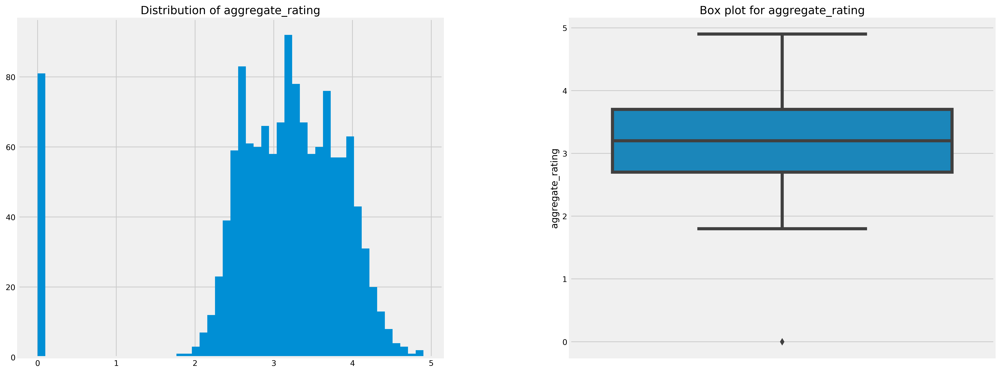

In [4]:
explore_variable(data, "aggregate_rating")

The middle 50% of ratings fall between 2.75 and 3.75 with a median of around 3.25. There are a large number of restaurants with a rating of 0. We should study these further to decide if they should be removed from the analysis or are outliers that carry useful information.

In [5]:
data[data.aggregate_rating == 0]

,name,aggregate_rating,rating_text,votes,average_cost_for_two,price_range,cuisines,cuisine_count,places,locality,...,Steak,Street Food,Sushi,Tapas,Tea,Tex-Mex,Thai,Turkish,Vegetarian,Vietnamese
1273,Créme de Levain,0.0,Not rated,1,120,2,"Healthy Food, Bakery, Ice Cream, Desserts",4,The Sanctuary Shopping Centre,Somerset West,...,0,0,0,0,0,0,0,0,0,0
1274,Kristen's Kick Ass Ice Cream- Noordhoek Farm V...,0.0,Not rated,0,50,1,"Desserts, Ice Cream",2,None,Noordhoek,...,0,0,0,0,0,0,0,0,0,0
1275,Milky Lane,0.0,Not rated,1,80,1,Desserts,1,N1 City Mall,Goodwood,...,0,0,0,0,0,0,0,0,0,0
1276,Smooch,0.0,Not rated,2,80,1,"Ice Cream, Desserts",2,Canal Walk Mall,Century City,...,0,0,0,0,0,0,0,0,0,0
1277,Daniela's Deliciously Decadent,0.0,Not rated,1,100,2,"Bakery, Desserts",2,Cape Quarter Lifestyle Center,Green Point,...,0,0,0,0,0,0,0,0,0,0
1278,Filo Yoghurt,0.0,Not rated,3,100,2,"Ice Cream, Desserts",2,None,Sea Point,...,0,0,0,0,0,0,0,0,0,0
1279,Smooch,0.0,Not rated,1,80,1,"Ice Cream, Desserts",2,None,Athlone,...,0,0,0,0,0,0,0,0,0,0
1280,Ice Rock Cafe,0.0,Not rated,2,90,1,Desserts,1,Sun Valley Mall,Noordhoek,...,0,0,0,0,0,0,0,0,0,0
1281,Bonjour Bakery,0.0,Not rated,3,120,2,"Bakery, Desserts",2,None,Sea Point,...,0,0,0,0,0,0,0,0,0,0
1282,Wakaberry,0.0,Not rated,3,80,1,Desserts,1,None,Strand,...,0,0,0,0,0,0,0,0,0,0


In [6]:
data[data.aggregate_rating == 0]["locality"].value_counts()

Kenilworth                13
CBD                        9
V & A Waterfront           5
Sea Point                  4
Goodwood                   3
Woodstock                  3
Hermanus                   3
Stellenbosch               3
Hout Bay                   2
Zonnebloem                 2
Bellville                  2
Brackenfell                2
Noordhoek                  2
Table View                 2
Somerset West              2
De Waterkant               1
Worcester                  1
Plumstead                  1
Bergvliet                  1
Crawford                   1
Franschhoek                1
Darling                    1
Strand                     1
Simon's Town               1
Athlone                    1
Paarl                      1
Fish Hoek                  1
Malmesbury                 1
Neelsie Student Centre     1
Parklands                  1
Century City               1
Constantia                 1
Kuils River                1
Observatory                1
Gordon's Bay  

In [7]:
data[data.locality == "Kenilworth"].shape

(37, 89)

Restaurants with very few votes are given a rating of 0. Interestingly, the suburb of Kenilworth has no ratings for 13 of its 37 restaurants.

Let's see how many votes are needed before a rating is registered.

In [8]:
data[(data.aggregate_rating > 0.0) & (data.aggregate_rating < 2)] 

,name,aggregate_rating,rating_text,votes,average_cost_for_two,price_range,cuisines,cuisine_count,places,locality,...,Steak,Street Food,Sushi,Tapas,Tea,Tex-Mex,Thai,Turkish,Vegetarian,Vietnamese
1271,Mugg & Bean,1.9,Poor,80,350,4,Cafe,1,None,Cape Town International Airport,...,0,0,0,0,0,0,0,0,0,0
1272,Dros,1.8,Poor,78,350,4,"South African, Grill, Seafood, Burger, Pizza",5,Canal Walk Mall,Century City,...,0,0,0,0,0,0,0,0,0,0


There are no restaurants with a rating of 1 or less. This could just be our sample or it could be the way the rating system works. It is unclear how the ratings are assigned but some research suggests that it's weighted based on the influence carried by those who give the rating, i.e. votes from user's with a larger following are more heavily weighted. 

Should we exclude restaurants with a zero rating from the analysis? A restaurant with no rating doesn't neccessarily mean it's terrible. Fast food franchises for example are unlikely to get as many people interested in voting for them as fine-dining establishments. Also, foodie influencers are more likely to review and vote on top restaurant than on everyday fast food joints. Restaurant with 0 rating still provide us good info about the type of food in offer in a specific area, but caution must be applied when performing aggegations. It will be considered on a case-by-case basis whether it makes sense for zero-rated restaurants to be kept or removed from analysis.

## Understanding Average Cost for Two

'average_cost_for_two' is of type int64 with 0 missing values


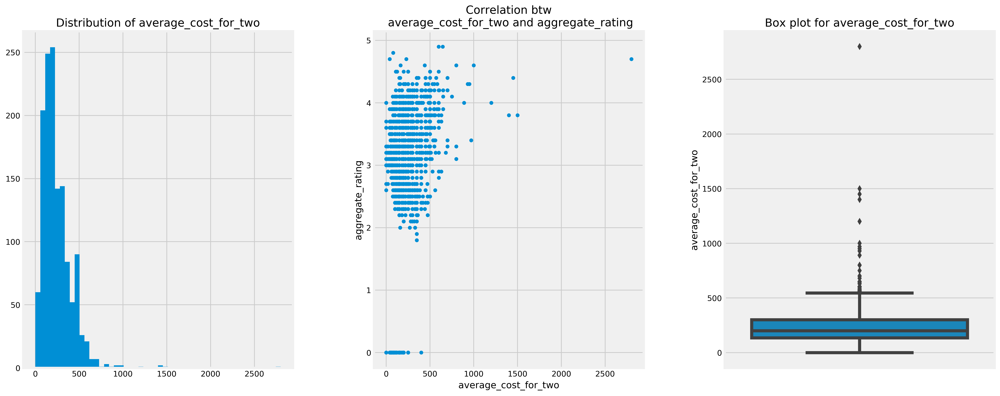

In [9]:
explore_variable(data, "average_cost_for_two", "aggregate_rating")

There isn't much correlation between avg price for two and rating. There are quite a few cost outliers but given that there are many fine-dining restaurants in Cape Town, this shouldn't be a suprise. Let's take a look at some of these.

In [10]:
data[data.average_cost_for_two > 1000]

,name,aggregate_rating,rating_text,votes,average_cost_for_two,price_range,cuisines,cuisine_count,places,locality,...,Steak,Street Food,Sushi,Tapas,Tea,Tex-Mex,Thai,Turkish,Vegetarian,Vietnamese
4,The Test Kitchen,4.7,Excellent,242,2800,4,"Continental, European",2,Old Biscuit Mill,Woodstock,...,0,0,0,0,0,0,0,0,0,0
30,Greenhouse - The Cellars Hohenort,4.4,Very Good,83,1450,4,European,1,The Cellars-Hohenhort,Constantia,...,0,0,0,0,0,0,0,0,0,0
141,Rust en Vrede,4.0,Very Good,50,1200,4,African,1,None,Stellenbosch,...,0,0,0,0,0,0,0,0,0,0
263,Reverie Social Table,3.8,Good,24,1400,4,"South African, International, Contemporary",3,None,Observatory,...,0,0,0,0,0,0,0,0,0,0
273,The Roundhouse,3.8,Good,68,1500,4,"European, African",2,None,Camps Bay,...,0,0,0,0,0,0,0,0,0,0


As expected, these are well-known top end restaurants in Cape Town. Their values may skew the mean so we should be cautious when including them in any analysis. Let's see if the top end restaurants (in terms of avg. cost) tend to come from certain suburbs.

In [11]:
data[data.average_cost_for_two >= 800]["locality"].value_counts()

Constantia          3
V & A Waterfront    2
Paarl               2
Stellenbosch        1
Woodstock           1
Observatory         1
Camps Bay           1
Gardens             1
Hermanus            1
Name: locality, dtype: int64

Let's get a sense of how the restaurants on the low end of pricing are distributed geographically.

In [12]:
data[data.average_cost_for_two <= 200]["locality"].value_counts()

CBD                                72
Stellenbosch                       62
V & A Waterfront                   38
Sea Point                          36
Bellville                          30
Claremont                          29
Kenilworth                         28
Century City                       24
Durbanville                        22
Franschhoek                        20
Table View                         19
Gardens                            18
Somerset West                      17
Green Point                        16
Observatory                        16
Paarl                              16
Brackenfell                        15
Woodstock                          15
De Waterkant                       14
Rondebosch                         14
Goodwood                           12
Hermanus                           11
Hout Bay                           11
Newlands                            9
Parklands                           8
Constantia                          8
Foreshore   

There are also many establishments that define themselves as `Drinks Only` - bars, cocktail lounges etc. We might want to create a sepersate dataset for these and/or exclude them from analysis in some instances. 

In [13]:
data[data["cuisines"] == "Drinks Only"]

,name,aggregate_rating,rating_text,votes,average_cost_for_two,price_range,cuisines,cuisine_count,places,locality,...,Steak,Street Food,Sushi,Tapas,Tea,Tex-Mex,Thai,Turkish,Vegetarian,Vietnamese
44,The Gin Bar,4.3,Very Good,66,250,3,Drinks Only,1,None,CBD,...,0,0,0,0,0,0,0,0,0,0
97,Fairview Tasting Room,4.1,Very Good,47,100,2,Drinks Only,1,None,Paarl,...,0,0,0,0,0,0,0,0,0,0
120,Boschendal,4.1,Very Good,34,150,2,Drinks Only,1,None,Franschhoek,...,0,0,0,0,0,0,0,0,0,0
180,Steenberg Tasting Room,4.0,Very Good,28,80,1,Drinks Only,1,None,Tokai,...,0,0,0,0,0,0,0,0,0,0
181,Waterford Wine Estate,4.0,Very Good,23,100,2,Drinks Only,1,None,Stellenbosch,...,0,0,0,0,0,0,0,0,0,0
201,Groot Constantia Winery,3.9,Good,52,90,1,Drinks Only,1,Groot Constantia Wine Estate,Constantia,...,0,0,0,0,0,0,0,0,0,0
223,Tasting Room at Babylonstoren,3.9,Good,36,100,2,Drinks Only,1,Babylonstoren Wine Estate,Franschhoek,...,0,0,0,0,0,0,0,0,0,0
225,Vergenoegd Wine Estate,3.9,Good,22,60,1,Drinks Only,1,None,Somerset West,...,0,0,0,0,0,0,0,0,0,0
237,Spice Route Tasting Room,3.9,Good,31,100,2,Drinks Only,1,Spice Route Farm,Paarl,...,0,0,0,0,0,0,0,0,0,0
240,Van Ryn's Distillery and Brandy cellar,3.9,Good,19,40,1,Drinks Only,1,None,Stellenbosch,...,0,0,0,0,0,0,0,0,0,0


## Understanding Price Range

'price_range' is of type int64 with 0 missing values


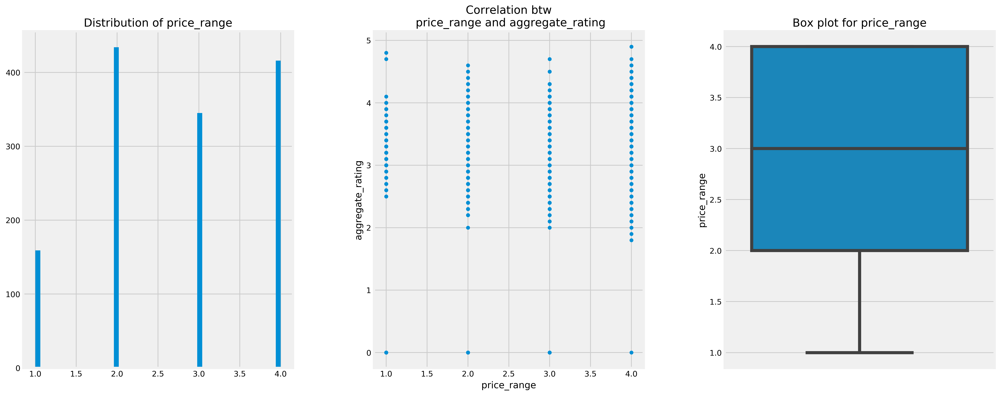

In [14]:
explore_variable(data, "price_range", "aggregate_rating")

Closely related to average price for two is the `price_range` variable assigned by Zomato. This is a 1 - 4 scale and we can see that the majority of restaurants are in price range 2 and 4. Let's take a look at the distribution of avg. costs for each price range. 

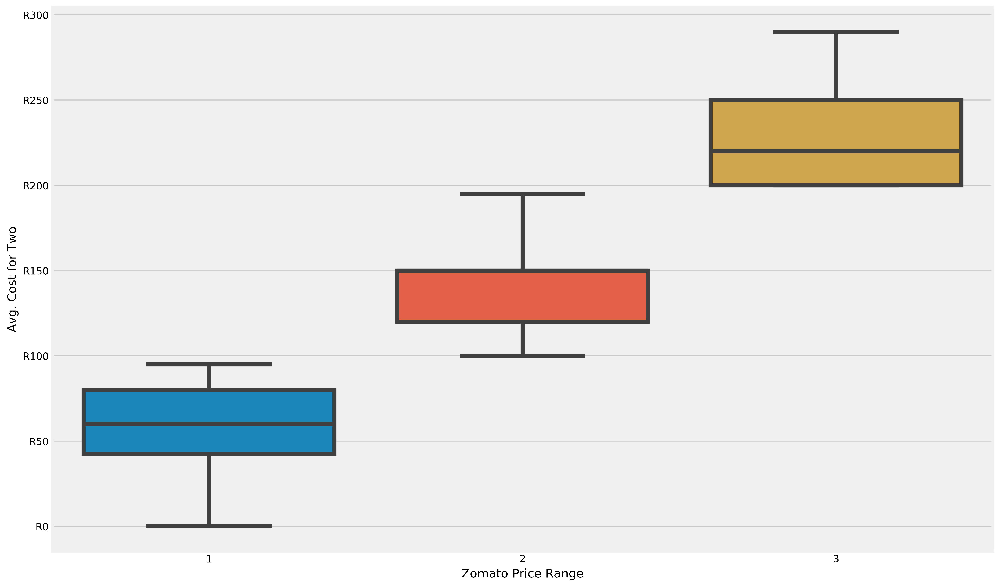

In [15]:
fig, ax = plt.subplots(1, 1, figsize=(15, 10), dpi=400)
ax = sns.boxplot(x="price_range", y="average_cost_for_two", data=data[data.price_range <= 3])
ax.set_ylabel("Avg. Cost for Two")
ax.set_xlabel("Zomato Price Range")
ax.yaxis.set_major_formatter(axes_formatter)

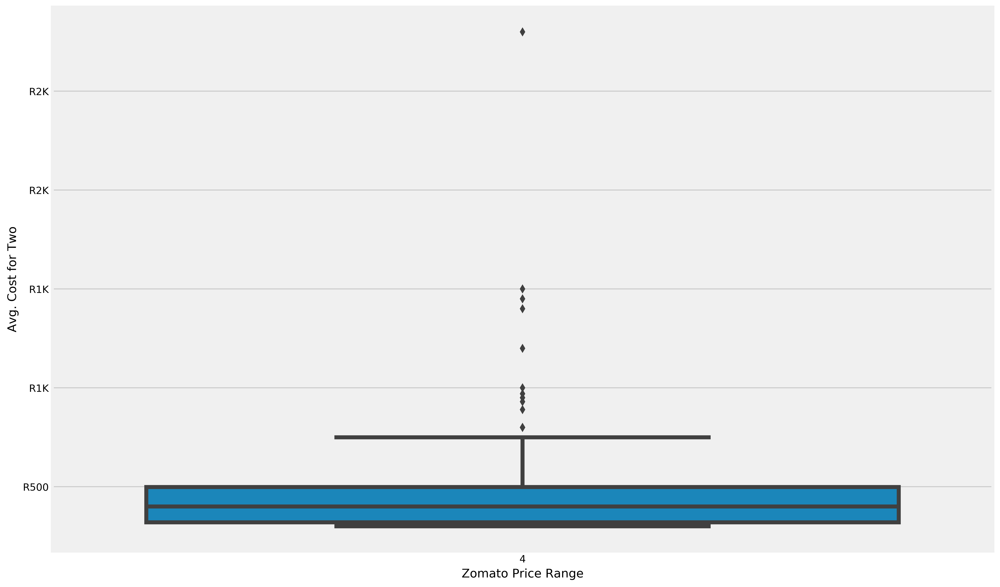

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(15, 10), dpi=400)
ax = sns.boxplot(x="price_range", y="average_cost_for_two", data=data[data.price_range > 3])
ax.set_ylabel("Avg. Cost for Two")
ax.set_xlabel("Zomato Price Range")
ax.yaxis.set_major_formatter(axes_formatter)

We must be cautious when using the mean average cost, especially for price range 4 because some of the large outliers will skew the mean.

In [17]:
data.pivot_table(index="price_range")["average_cost_for_two"]

price_range
1     56.037736
2    138.824885
3    229.840580
4    434.290865
Name: average_cost_for_two, dtype: float64

Text(0.5,1,'Relationship between Price Range and Average Cost for Two')

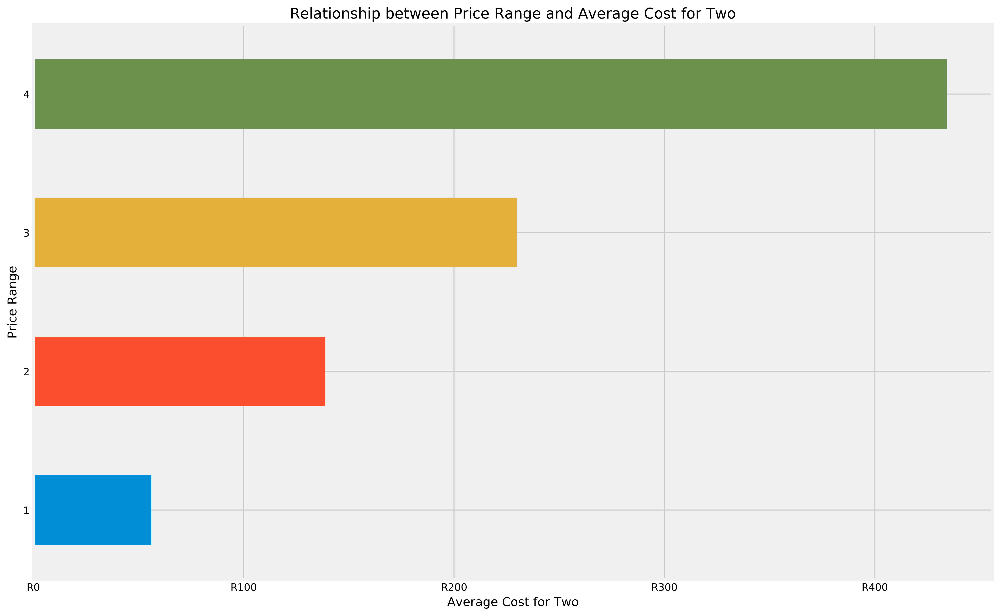

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(15, 10), dpi=400)
ax = data.pivot_table(index="price_range")["average_cost_for_two"].plot.barh(ax=ax)
ax.set_xlabel("Average Cost for Two")
ax.xaxis.set_major_formatter(axes_formatter)
ax.set_ylabel("Price Range")
ax.set_title("Relationship between Price Range and Average Cost for Two")

## Understanding Votes

'votes' is of type int64 with 0 missing values


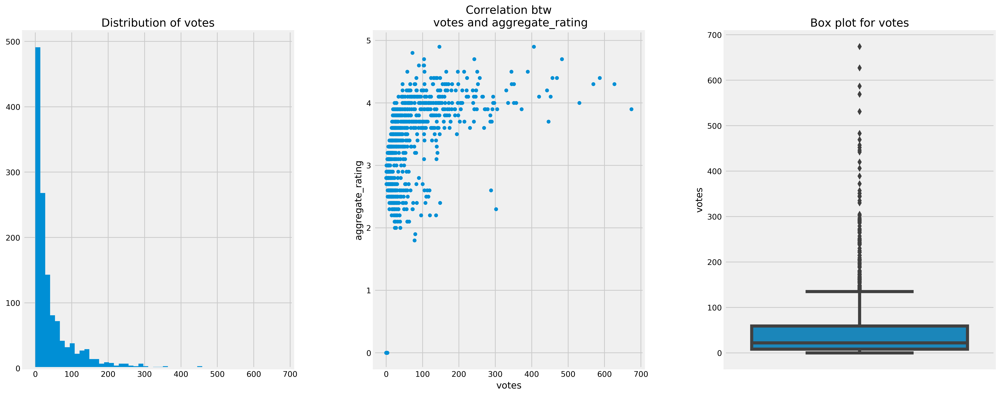

In [19]:
explore_variable(data, "votes", "aggregate_rating")

The majority of restaurnts have less than 200 votes with higher vote counts being provided for the restaurants that earn a higher rating. It's possible that people are more interested to vote on the higher-end restaurants and then due to Zomato's rating system, there is a non-linear relationship between the influence carried by those who do vote based on their community influence. 

Let's study the restaurants with the most votes.

In [20]:
data[data.votes >= 200]

,name,aggregate_rating,rating_text,votes,average_cost_for_two,price_range,cuisines,cuisine_count,places,locality,...,Steak,Street Food,Sushi,Tapas,Tea,Tex-Mex,Thai,Turkish,Vegetarian,Vietnamese
0,The Potluck Club,4.9,Excellent,406,600,4,"European, Contemporary",2,Old Biscuit Mill,Woodstock,...,0,0,0,0,0,0,0,0,0,0
4,The Test Kitchen,4.7,Excellent,242,2800,4,"Continental, European",2,Old Biscuit Mill,Woodstock,...,0,0,0,0,0,0,0,0,0,0
5,Jarryds,4.7,Excellent,483,230,3,"Cafe, Burger",2,None,Sea Point,...,0,0,0,0,0,0,0,0,0,0
11,La Mouette,4.5,Excellent,250,600,4,"Mediterranean, French",2,None,Sea Point,...,0,0,0,0,0,0,0,0,0,0
12,Bistro Sixteen82,4.5,Excellent,214,500,4,"French, Asian, European",3,Steenberg Hotel,Constantia,...,0,0,0,0,0,0,0,0,0,0
16,The Creamery,4.5,Excellent,389,110,2,"Desserts, Ice Cream",2,None,Newlands,...,0,0,0,0,0,0,0,0,0,0
17,Four & Twenty,4.5,Excellent,344,250,3,"Cafe, Bakery, Desserts, Deli",4,None,Wynberg,...,0,0,0,0,0,0,0,0,0,0
18,Kloof Street House,4.4,Very Good,469,350,4,Mediterranean,1,None,Gardens,...,0,0,0,0,0,0,0,0,0,0
19,Pigalle,4.4,Very Good,257,500,4,Seafood,1,None,Green Point,...,0,0,0,0,0,0,0,0,0,0
26,El Burro,4.4,Very Good,457,350,4,Mexican,1,None,Green Point,...,0,0,0,0,0,0,0,0,0,0


What I find interesting is not the restaurants that get top ratings with lots of votes, but rather the restaurants that get good, average or poor ratings with lots of votes. This tells us a lot, far more than restaurants with low ratings that have near zero votes. 

## Understanding Cuisines

'cuisine_count' is of type int64 with 0 missing values


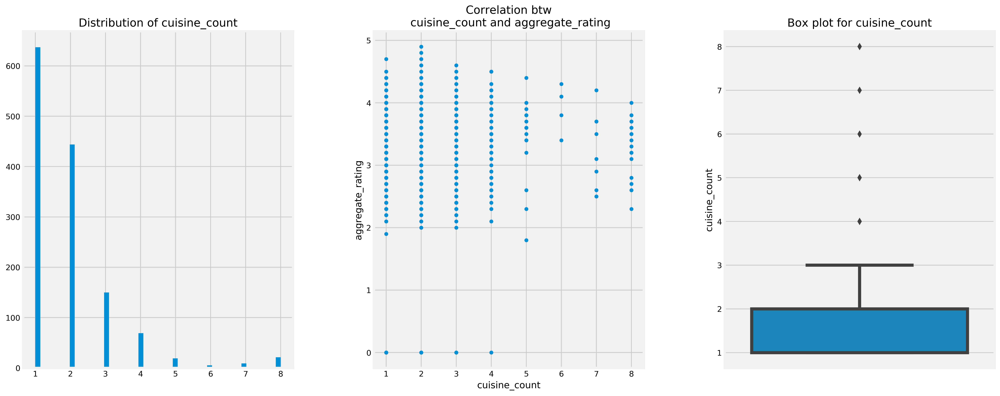

In [21]:
explore_variable(data, "cuisine_count", "aggregate_rating")

Ratings vary across all numbers of cuisines on offer, however it will be useful to see if there are specific trends with low and high scoring restaurants - not in the total cuisines on offer, but rather if specific cuisines do better than others.

## Understanding Online Delivery Flag

'has_online_delivery' is of type int64 with 0 missing values


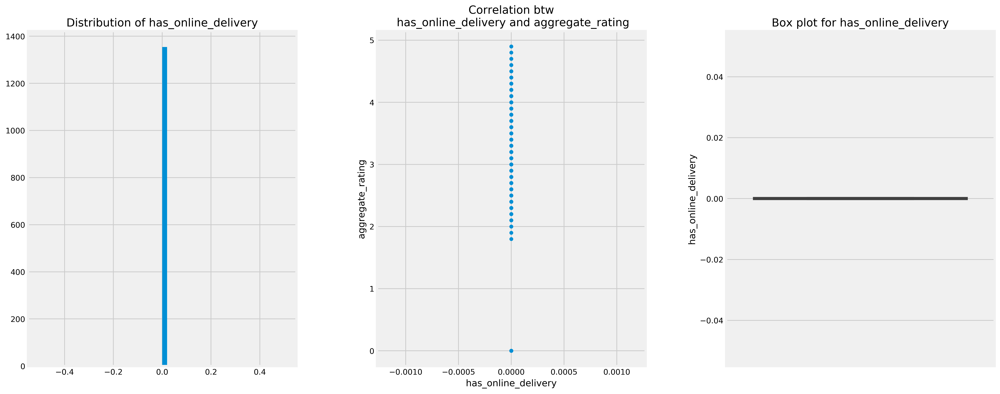

In [22]:
explore_variable(data, "has_online_delivery", "aggregate_rating")

In [23]:
data.has_online_delivery.value_counts()

0    1354
Name: has_online_delivery, dtype: int64

This value doesn't seem to be populated so we'll ignore it in the analyis as it adds no value.

## Understanding Table Booking Flag

'has_table_booking' is of type int64 with 0 missing values


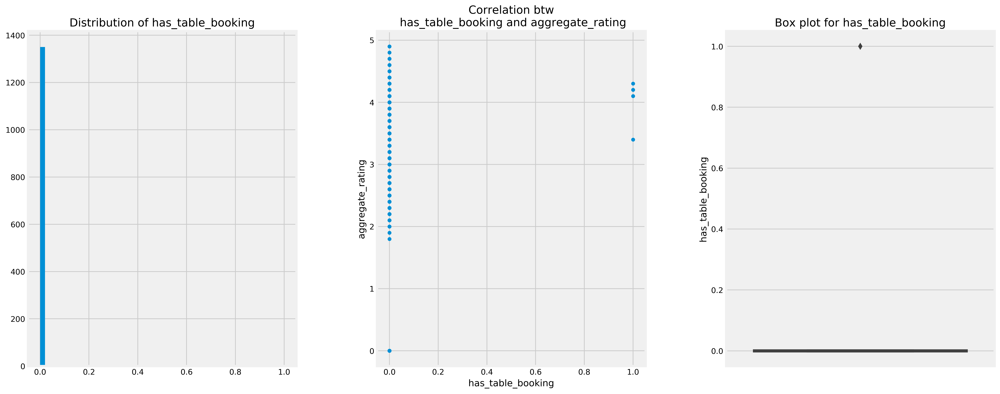

In [24]:
explore_variable(data, "has_table_booking", "aggregate_rating")

In [25]:
data.has_table_booking.value_counts()

0    1350
1       4
Name: has_table_booking, dtype: int64

Much the same here, not much value in this value so we'll ignore it.

## Understanding Relationship Between Rating, Votes, Number of Cuisines and Price Range

Let's view the mean values for rating, vote count and total number of cuisines on offer per price range.

Text(0.5,0.98,'Avg. Rating, Votes & No. Cuisines by Price Range')

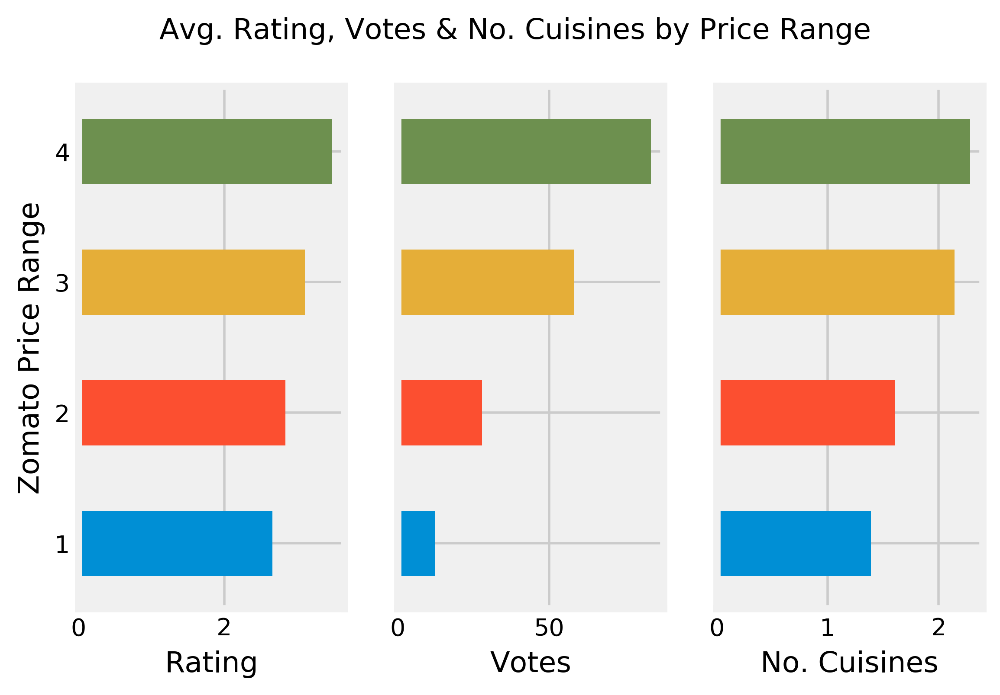

In [26]:
df = data.pivot_table(index="price_range", aggfunc="mean")

cols = ["aggregate_rating", "votes", "cuisine_count"]
xlabels = ["Rating", "Votes", "No. Cuisines"]
fig, ax = plt.subplots(1, 3, sharey='row', dpi=400)
#fig.subplots_adjust(hspace=0.4)

for ax, col, xlabel in zip(ax.ravel(), cols, xlabels):
    df[col].plot.barh(ax=ax)
    ax.set_xlabel(xlabel)
    if col == "average_cost_for_two":
        ax.xaxis.set_major_formatter(axes_formatter)
    ax.set_ylabel("Zomato Price Range")
   
plt.suptitle("Avg. Rating, Votes & No. Cuisines by Price Range")
#save_fig('investment-multiple-years-risks-lump-sum-monthly-contrib')

The lower the price range, the lower the avgerage rating and average number of votes. 

## Observations & Actions
- Restaurants with zero rating based on too few votes make it hard to extract useful insight so we'll create a seperate data set for these and take them out of the primary analysis. 
- Some establishments serve drinks only, we'll create a seperate data set for these, but keep them in the original dataset. 

## Extracting Final Analysis Data

In [27]:
zero_rated = data[data.aggregate_rating == 0.0]
print(zero_rated.shape)
zero_rated.head()

(81, 89)


,name,aggregate_rating,rating_text,votes,average_cost_for_two,price_range,cuisines,cuisine_count,places,locality,...,Steak,Street Food,Sushi,Tapas,Tea,Tex-Mex,Thai,Turkish,Vegetarian,Vietnamese
1273,Créme de Levain,0.0,Not rated,1,120,2,"Healthy Food, Bakery, Ice Cream, Desserts",4,The Sanctuary Shopping Centre,Somerset West,...,0,0,0,0,0,0,0,0,0,0
1274,Kristen's Kick Ass Ice Cream- Noordhoek Farm V...,0.0,Not rated,0,50,1,"Desserts, Ice Cream",2,None,Noordhoek,...,0,0,0,0,0,0,0,0,0,0
1275,Milky Lane,0.0,Not rated,1,80,1,Desserts,1,N1 City Mall,Goodwood,...,0,0,0,0,0,0,0,0,0,0
1276,Smooch,0.0,Not rated,2,80,1,"Ice Cream, Desserts",2,Canal Walk Mall,Century City,...,0,0,0,0,0,0,0,0,0,0
1277,Daniela's Deliciously Decadent,0.0,Not rated,1,100,2,"Bakery, Desserts",2,Cape Quarter Lifestyle Center,Green Point,...,0,0,0,0,0,0,0,0,0,0


In [28]:
print("Data shape before removing rows:", data.shape)
data = data[data.aggregate_rating != 0.0]
print("Data shape after removing rows:", data.shape)

Data shape before removing rows: (1354, 89)
Data shape after removing rows: (1273, 89)


In [29]:
# non-zero rated drinks establishments.
drinks = data[data.cuisines == "Drinks Only"]
print(drinks.shape)
drinks.head()

(150, 89)


,name,aggregate_rating,rating_text,votes,average_cost_for_two,price_range,cuisines,cuisine_count,places,locality,...,Steak,Street Food,Sushi,Tapas,Tea,Tex-Mex,Thai,Turkish,Vegetarian,Vietnamese
44,The Gin Bar,4.3,Very Good,66,250,3,Drinks Only,1,None,CBD,...,0,0,0,0,0,0,0,0,0,0
97,Fairview Tasting Room,4.1,Very Good,47,100,2,Drinks Only,1,None,Paarl,...,0,0,0,0,0,0,0,0,0,0
120,Boschendal,4.1,Very Good,34,150,2,Drinks Only,1,None,Franschhoek,...,0,0,0,0,0,0,0,0,0,0
180,Steenberg Tasting Room,4.0,Very Good,28,80,1,Drinks Only,1,None,Tokai,...,0,0,0,0,0,0,0,0,0,0
181,Waterford Wine Estate,4.0,Very Good,23,100,2,Drinks Only,1,None,Stellenbosch,...,0,0,0,0,0,0,0,0,0,0


# Useful Functions for Analysis

In [30]:
def top(df, n=5, column='aggregate_rating'):
    '''Returns the top n rows of data set df ordered desc'''
    return df.sort_values(by=column, ascending=False)[:n]

def bottom(df, n=5, column='aggregate_rating'):
    '''Returns the bottoms n rows of data set df ordered asc'''
    return df.sort_values(by=column, ascending=True)[:n]

def get_stats(group):
    '''Returns the min, max, count and mean summary statistics for a grouped data set'''
    return {'min': group.min(), 'max': group.max(), 'count': group.count(),
            'mean': group.mean(), 'median': group.median(), 'std': group.std()} 

def get_cuisine_cols():
    cols = ["name", "aggregate_rating", "rating_text", "votes", "average_cost_for_two", "price_range", "cuisines", "cuisine_count", "places", "locality", "region", "city", "latitude", "longitude", "has_online_delivery", "has_table_booking", "top_bottom"]
    '''Returns the column names of all the cuisine type column, not including the cuisine_count column'''
    cuisine_cols = [col for col in data.columns.tolist() if col not in cols]
    return cuisine_cols  

# Trend Analysis

## Restaurant Count by Region and Suburb

Text(0.5,1,'Number of Restaurants by Region and Price Range')

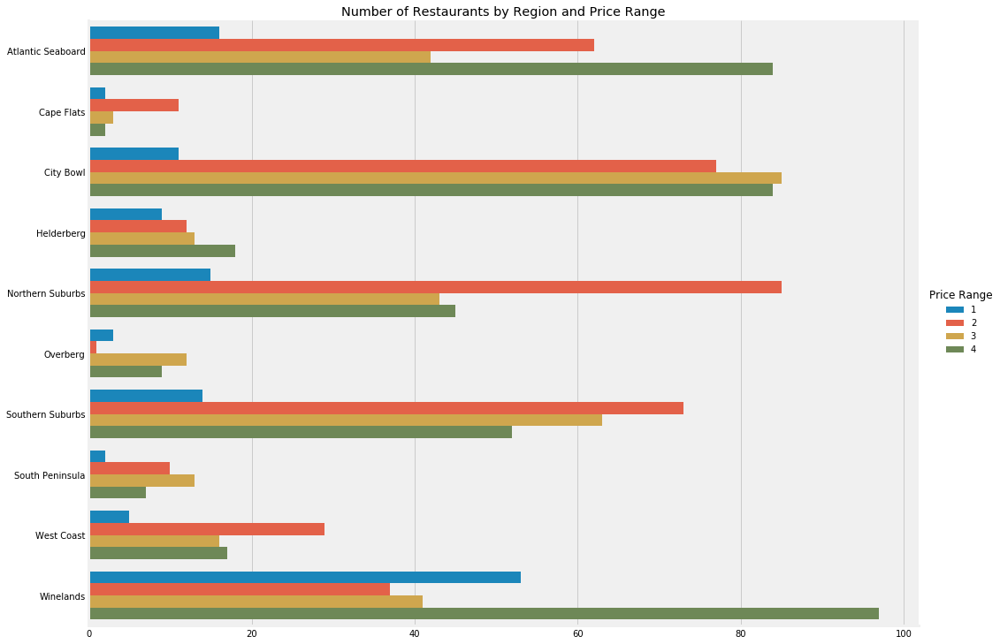

In [31]:
region_order = ["Atlantic Seaboard", "Cape Flats","City Bowl", "Helderberg", "Northern Suburbs", "Overberg","Southern Suburbs","South Peninsula","West Coast", "Winelands"]
g = sns.catplot(kind="count", y="region", hue="price_range", order=region_order, data=data, ci=None, height=10, aspect=1.5)
g.set_axis_labels("", "")
g._legend.set_title("Price Range")
ax = plt.gca()
ax.set_title("Number of Restaurants by Region and Price Range")

- The Atlantic Seaboard, City Bowl, Northern Suburbs, Southern Suburbs and Winelands are well represented. 
- Winelands has the highest number of restaurants in the top end and bottom end price ranges.
- Northern Suburbs has most restaurants in price range 2
- City bowl has most resuarants in price range 3. 

Text(0.5,1,'Number of Restaurants by Suburb and Price Range')

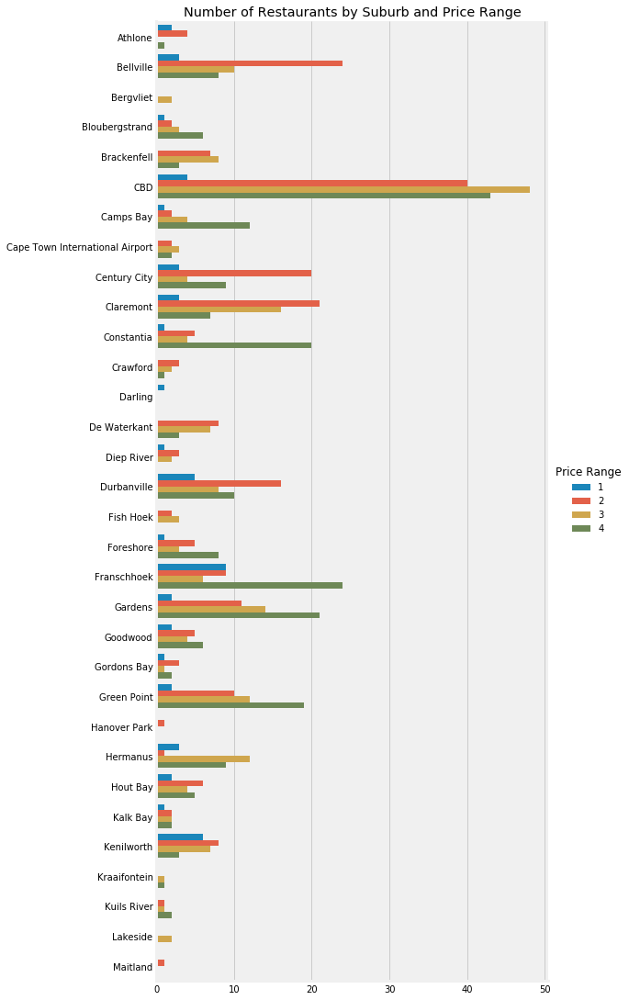

In [32]:
df = data[data.locality <= "Malmesbury"]
order = data.locality.value_counts().sort_index().index
order = [locality for locality in order if locality <= "Malmesbury"]
g = sns.catplot(kind="count", y="locality", hue="price_range", data=df, order=order, ci=None, height=15, aspect=0.6)
g.set_axis_labels("", "")
g._legend.set_title("Price Range")
ax = plt.gca()
ax.set_title("Number of Restaurants by Suburb and Price Range")

Text(0.5,1,'Number of Restaurants by Suburb and Price Range')

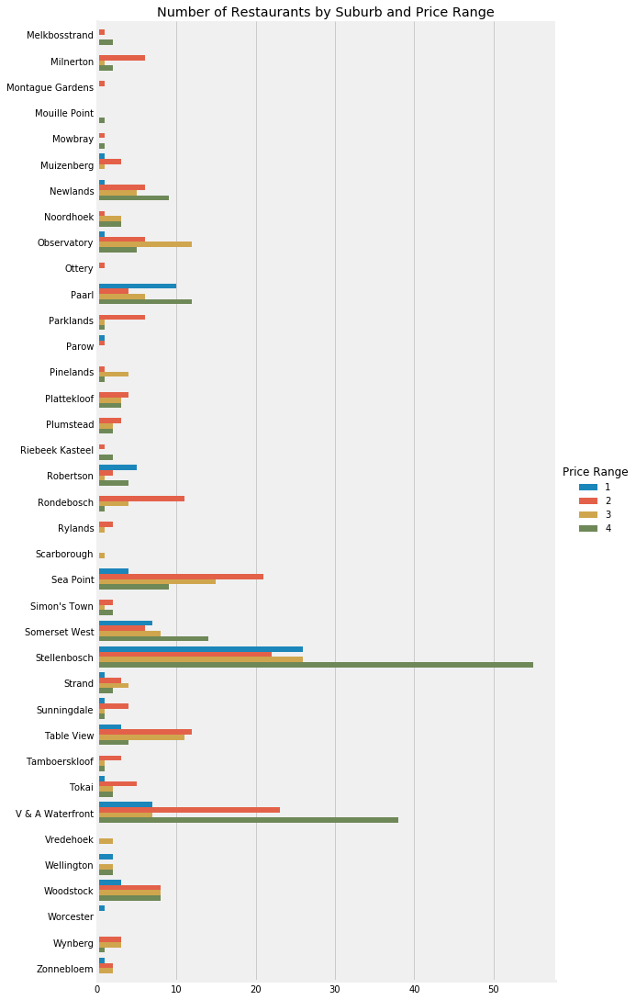

In [33]:
df = data[data.locality > "Malmesbury"]
order = data.locality.value_counts().sort_index().index
order = [locality for locality in order if locality > "Malmesbury"]
g = sns.catplot(kind="count", y="locality", hue="price_range", data=df, order=order, ci=None, height=15, aspect=0.6)
g.set_axis_labels("", "")
g._legend.set_title("Price Range")
ax = plt.gca()
ax.set_title("Number of Restaurants by Suburb and Price Range")

## Restaurant Rating by Price Range and Region

Saving figure average_rating_by_region


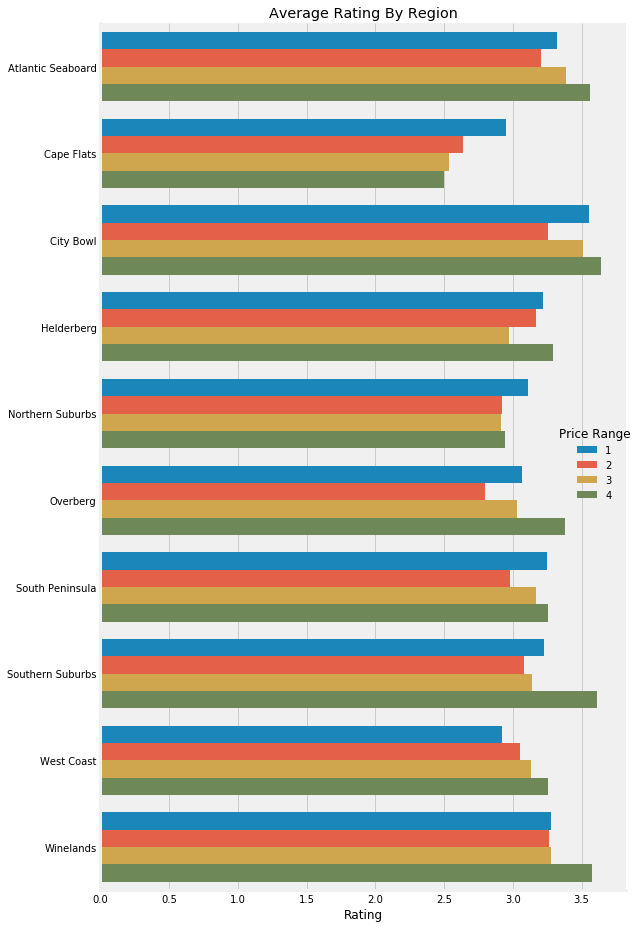

In [34]:
order = data.region.value_counts().sort_index().index
g = sns.catplot(kind="bar", x="aggregate_rating", y="region", order=order, hue="price_range", 
                data=data, ci=None, height=13, aspect=0.6)
g.set_axis_labels("Rating", "")
g._legend.set_title("Price Range")
ax = plt.gca()
ax.set_title("Average Rating By Region")
save_fig("average_rating_by_region")

In [35]:
data[data.region == "Overberg"]["locality"].value_counts()

Hermanus    25
Name: locality, dtype: int64

## Restaurant Rating by Price Range and Suburb

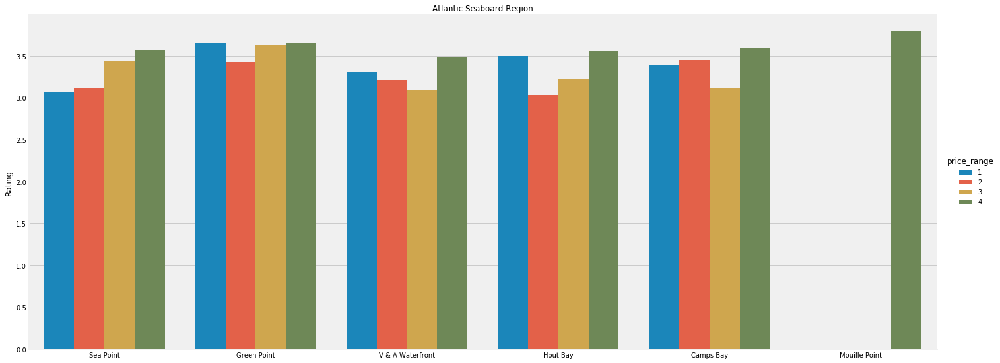

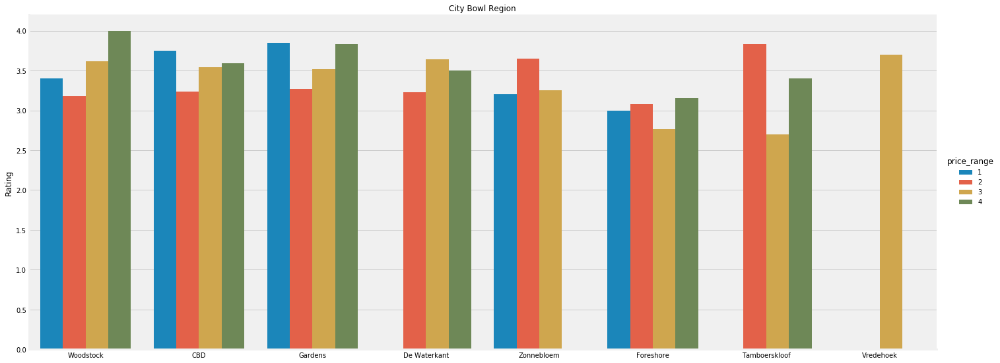

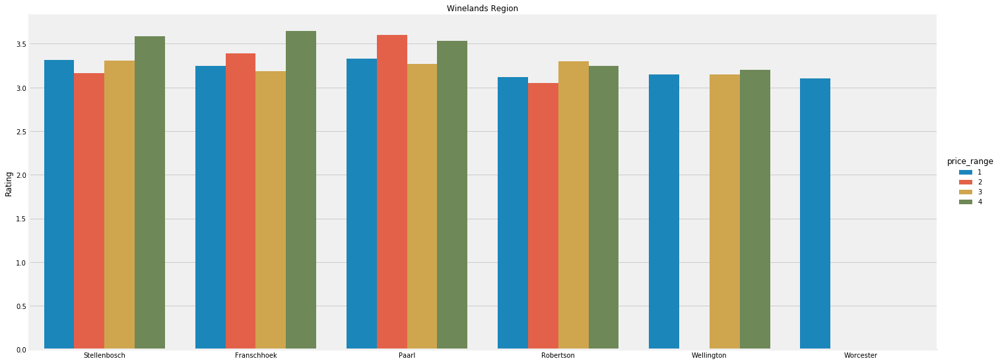

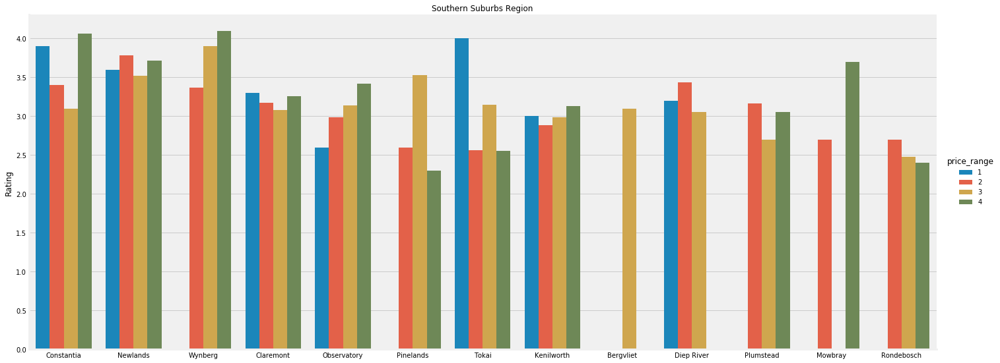

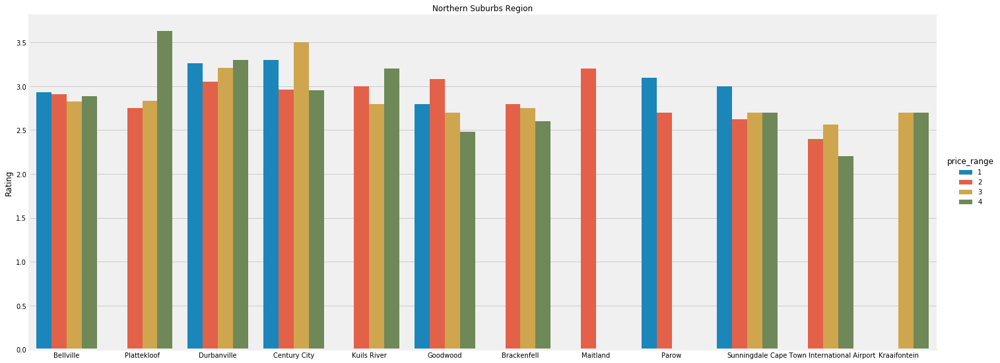

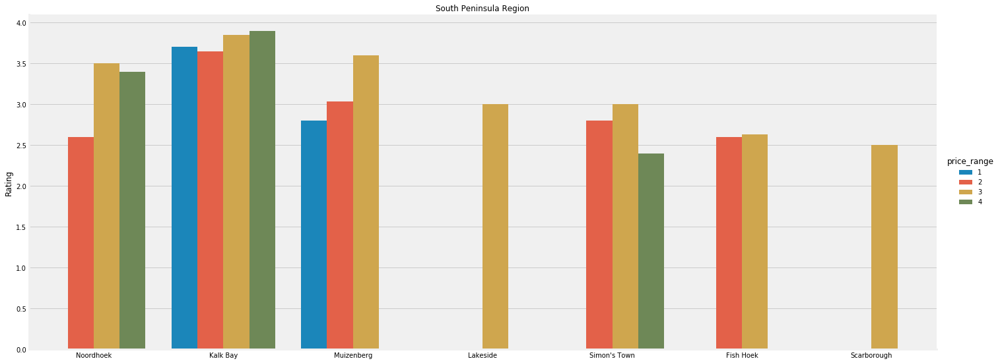

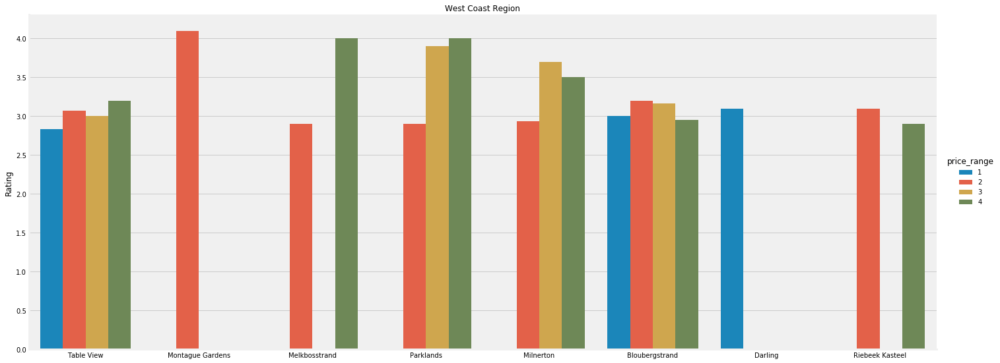

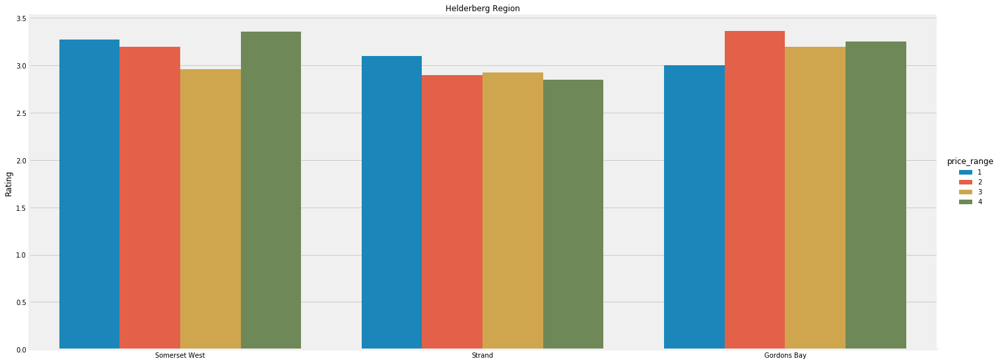

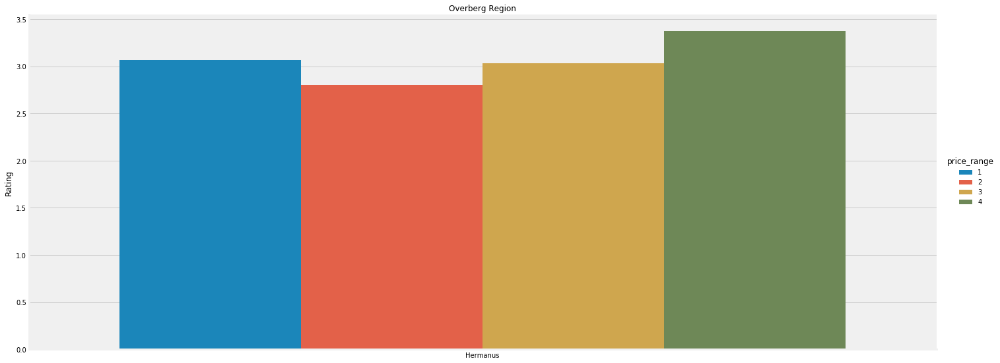

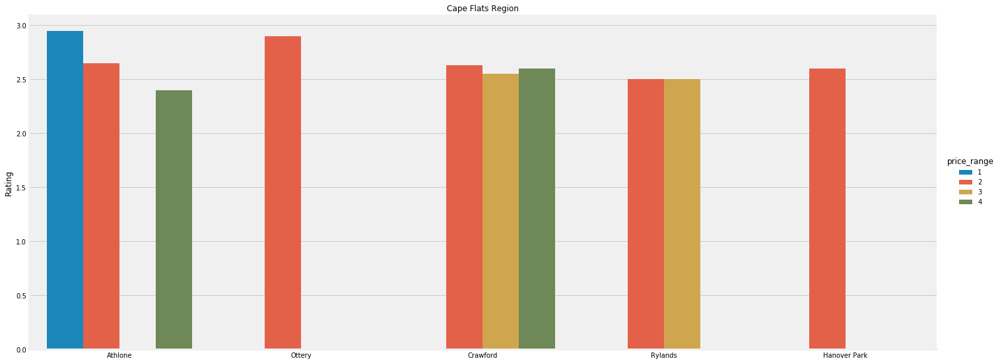

In [36]:
regions = ["Atlantic Seaboard", "City Bowl", "Winelands", "Southern Suburbs", "Northern Suburbs", "South Peninsula", "West Coast", "Helderberg", "Overberg", "Cape Flats"]

for region in regions:
    g = sns.catplot(kind="bar", y="aggregate_rating", x="locality", hue="price_range", row="region",
                     data=data[data.region==region], height=8, aspect=2.5, ci=None)
    g.set_axis_labels("", "Rating")
    g.set_titles("{row_name} Region")

## Overall Rating by Suburb

Text(0.5,1,'Overall Rating by Suburb')

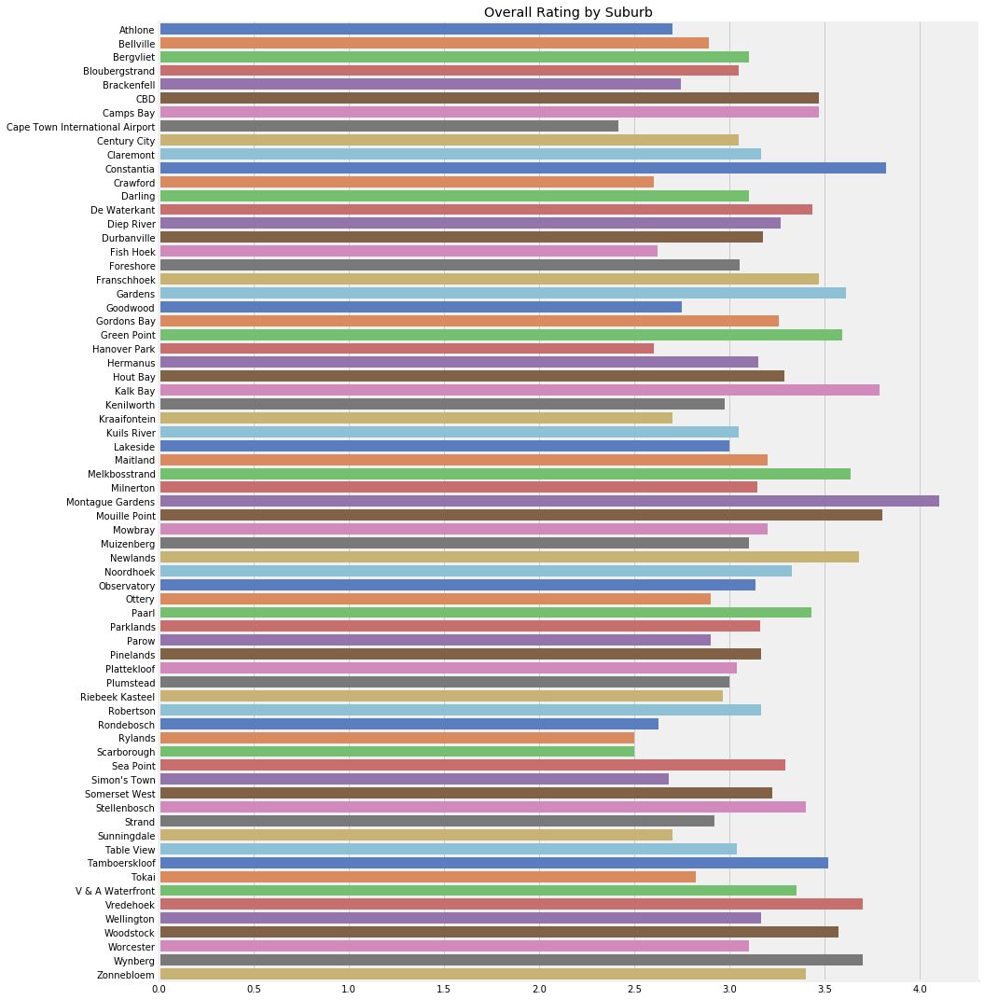

In [37]:
order = data.locality.value_counts().sort_index().index
g = sns.catplot(data=data, y="locality", x="aggregate_rating", height=15, kind="bar", ci=None, order=order, palette="muted")
g.set_axis_labels("", "")
ax = plt.gca()
ax.set_title("Overall Rating by Suburb")

Text(0.5,1,'Overall Rating by Suburb')

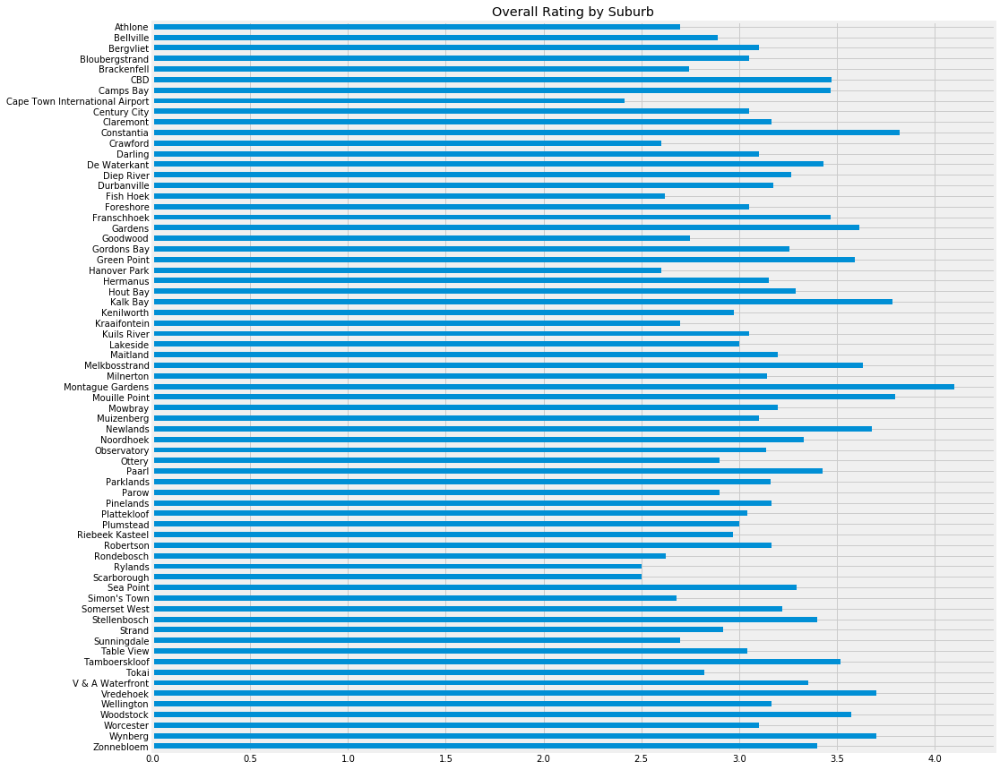

In [38]:
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
ax = data.pivot_table(index="locality", values="aggregate_rating").sort_index(ascending=False).plot.barh(ax=ax, legend=False)
ax.set_ylabel("")
ax.set_xlabel("")
ax.set_title("Overall Rating by Suburb")

## Overall Cuisine Count

In [39]:
data[get_cuisine_cols()].sum().sort_values(ascending=False)

Cafe               272
Burger             167
Drinks Only        155
Grill              143
Desserts           136
Fast Food          123
Pizza              114
Seafood            106
Bakery              85
European            81
South African       80
Italian             71
Mediterranean       71
Contemporary        70
Finger Food         70
Steak               63
African             57
Sushi               53
Healthy Food        46
Ice Cream           40
American            36
Beverages           34
Indian              31
Mexican             29
Tapas               29
Deli                28
French              26
Asian               26
Continental         22
Portuguese          20
                  ... 
Lebanese             5
Sandwich             4
British              4
Middle Eastern       4
Greek                3
Spanish              3
Caribbean            3
Latin American       2
Pakistani            2
Bar Food             2
Belgian              2
Tex-Mex              2
Vietnamese 

In [40]:
cuisine_tot = pd.DataFrame(data[get_cuisine_cols()].sum().sort_index(ascending=True)).reset_index()
cuisine_tot.columns = ["Cuisine", "Total"]

Saving figure cuisine_count


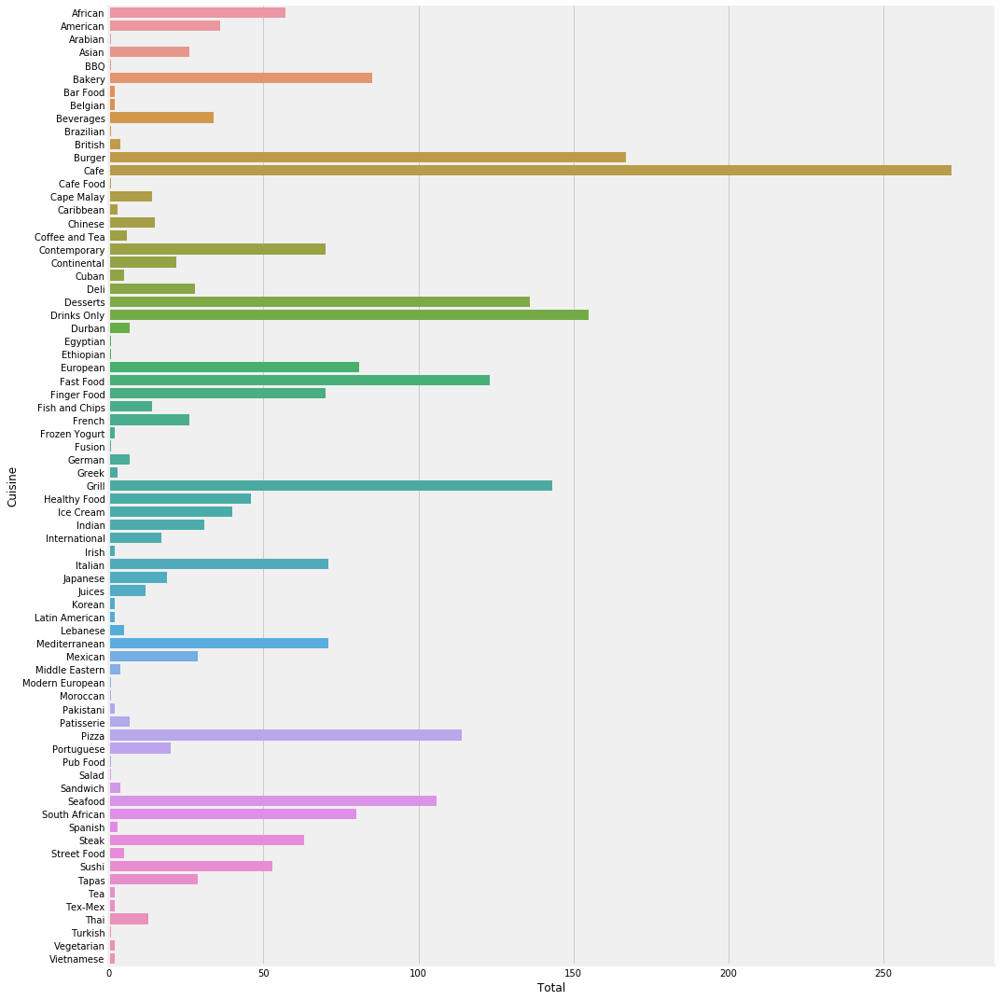

In [41]:
ax = sns.catplot(x="Total", y="Cuisine", data=cuisine_tot, kind="bar", height=15)
save_fig("cuisine_count")

- Burger, Cafe, Desserts, Drinks Only, Grill, Pizza and Seafood are the most common occuring restaurants.

## Suburbs With Highest Count of Cuisines

Let's find out which suburbs have the highest number of each of the above most common cuisines. 

Saving figure suburbs_highest_count_most_common_cuisines


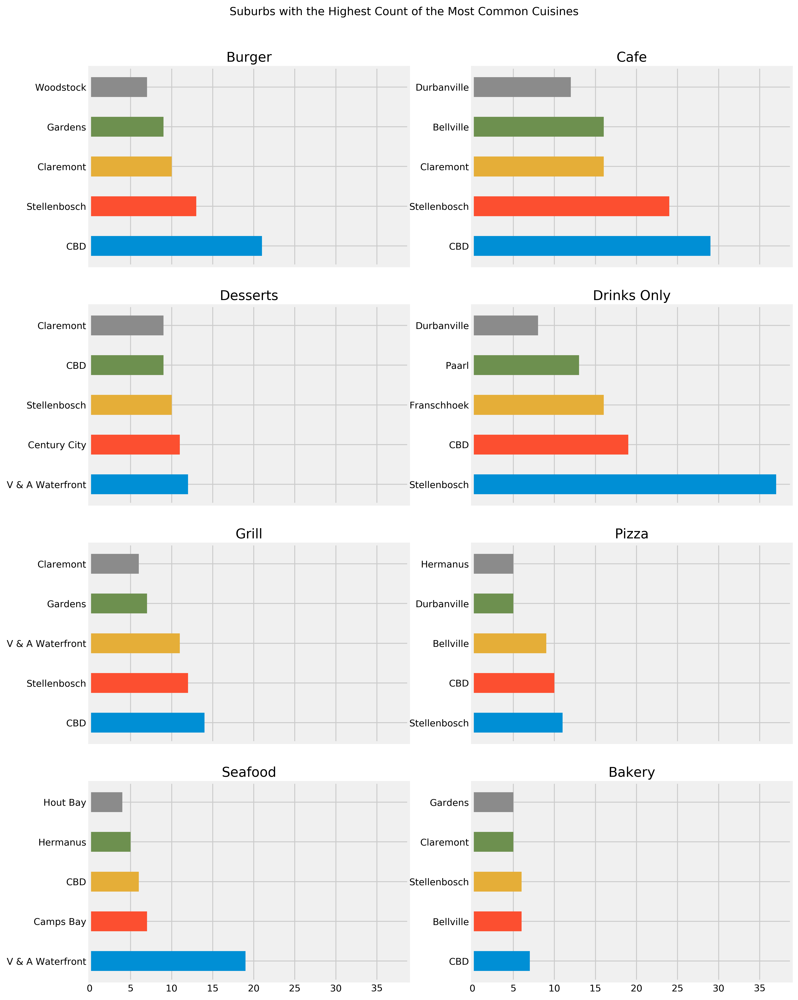

In [42]:
most_common = ["Burger", "Cafe", "Desserts", "Drinks Only", "Grill", "Pizza", "Seafood", "Bakery"]
df = data.pivot_table(index=["locality"], values=most_common, aggfunc="sum")

fig, ax = plt.subplots(4, 2, sharex=True, figsize=(12, 18), dpi=400)
fig.subplots_adjust(hspace=0.2)
plt.suptitle("Suburbs with the Highest Count of the Most Common Cuisines", x=0.47, y=0.93)
for cuisine, ax in zip(most_common, ax.ravel()):    
    sorted_df = df.sort_values(by=cuisine, ascending=False).head(5)[cuisine]
    ax = sorted_df.plot.barh(ax=ax)
    ax.set_ylabel("")
    ax.set_title(cuisine)

save_fig("suburbs_highest_count_most_common_cuisines", tight_layout=False)

## Top and Bottom Rated Cuisines

Text(0.5,1,'Ratings for Cuisine Types')

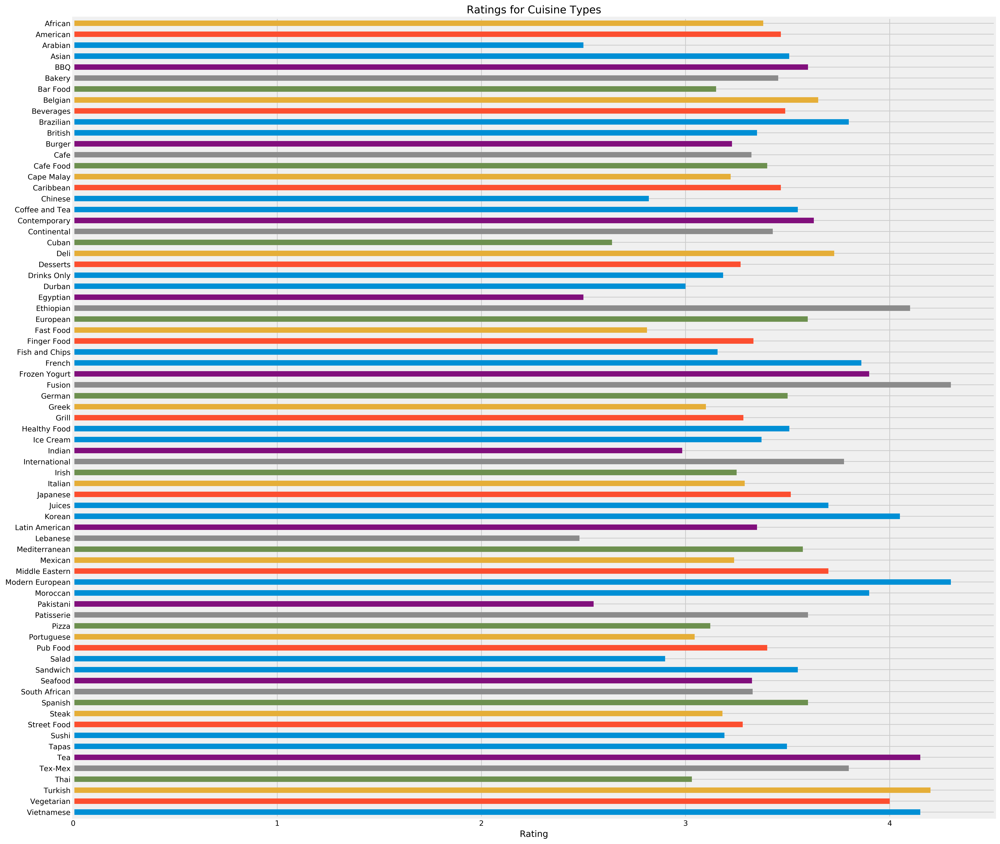

In [43]:
# Find the rating of each cuisine type but only show those cuisines prespresented by more than one restaurant. 

result = {}

for cuisine in get_cuisine_cols():    
    result[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="aggregate_rating")["aggregate_rating"].values
 
cuisine_ratings_df = pd.DataFrame(data=result).T

df = pd.concat([cuisine_ratings_df, data[get_cuisine_cols()].sum()], axis=1)
df = df.sort_index(ascending=False)
df.columns = ["rating", "total"]

fig, ax = plt.subplots(1, 1, figsize=(20, 20), dpi=400)
ax = df[df.total > 0]["rating"].plot.barh(ax=ax)
ax.set_xlabel("Rating")
ax.set_title("Ratings for Cuisine Types")

Text(0.5,1,'Ratings for Cuisine Types with 2 or More Restaurants')

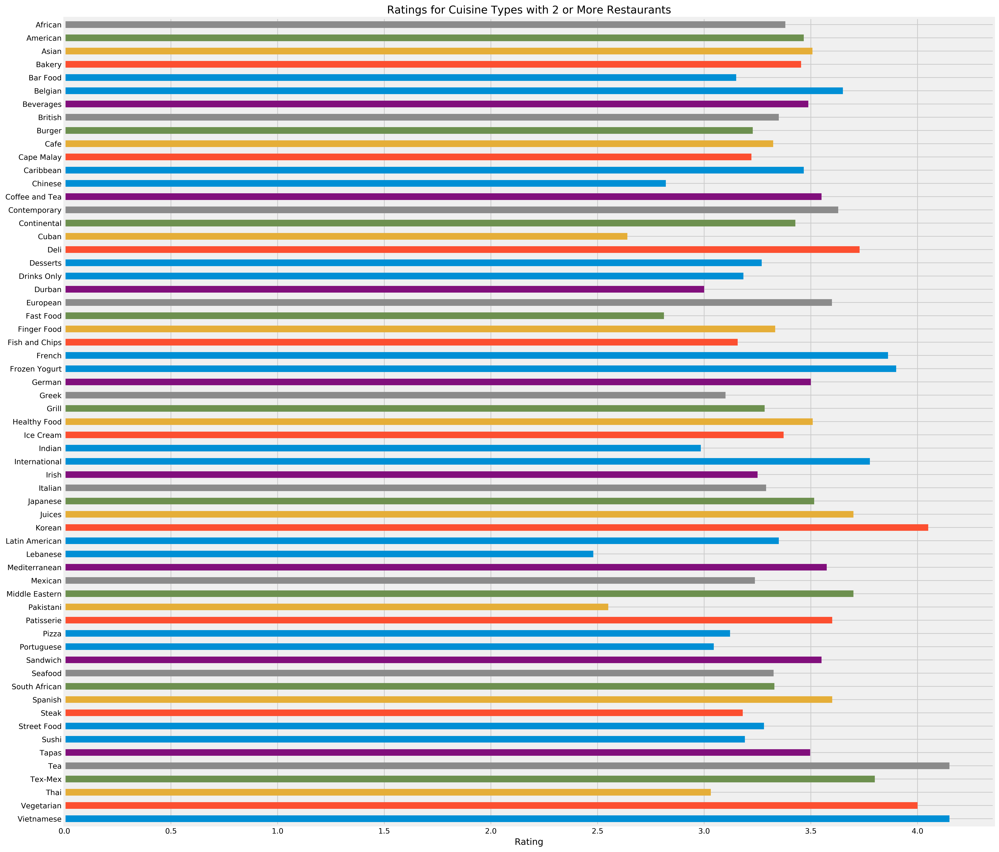

In [44]:
# Find the rating of each cuisine type but only show those cuisines prespresented by more than one restaurant. 

result = {}

for cuisine in get_cuisine_cols():    
    result[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="aggregate_rating")["aggregate_rating"].values
 
cuisine_ratings_df = pd.DataFrame(data=result).T

df = pd.concat([cuisine_ratings_df, data[get_cuisine_cols()].sum()], axis=1)
df = df.sort_index(ascending=False)
df.columns = ["rating", "total"]

fig, ax = plt.subplots(1, 1, figsize=(20, 20), dpi=400)
ax = df[df.total > 1]["rating"].plot.barh(ax=ax)
ax.set_xlabel("Rating")
ax.set_title("Ratings for Cuisine Types with 2 or More Restaurants")

Text(0.5,1,'Ratings for Cuisine Types with 5 or More Restaurants')

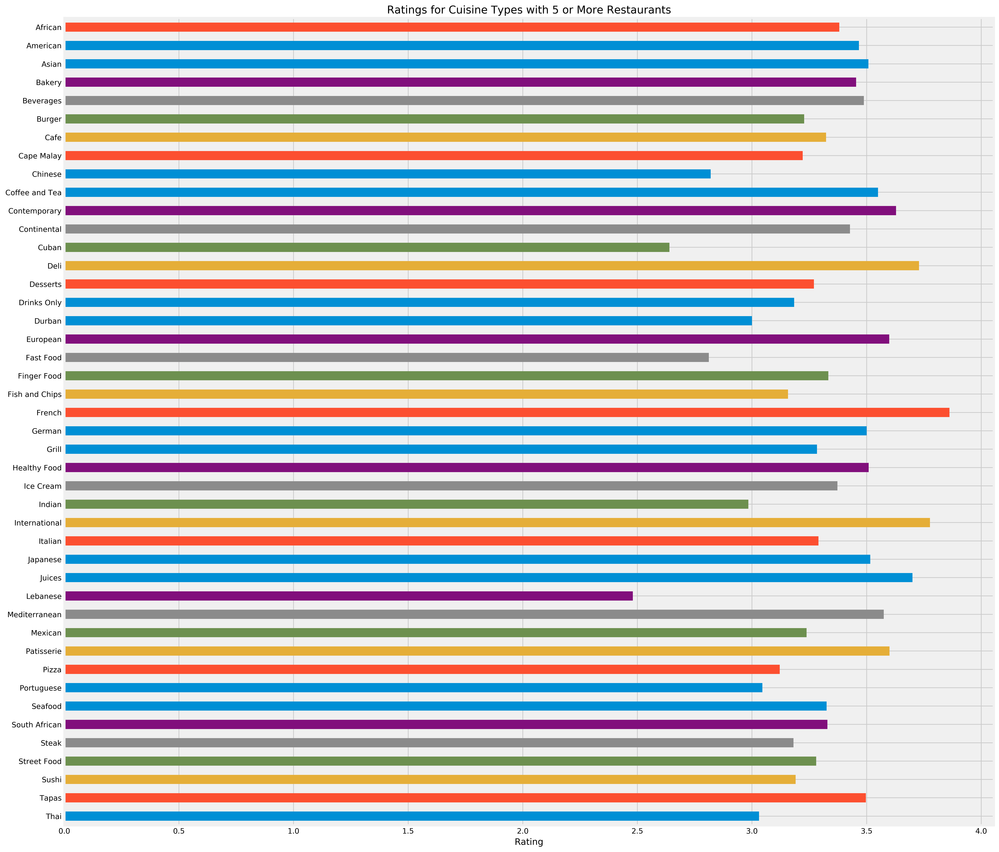

In [45]:
# Find the rating of each cuisine type but only show those cuisines prespresented by more than one restaurant. 

result = {}

for cuisine in get_cuisine_cols():    
    result[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="aggregate_rating")["aggregate_rating"].values
 
cuisine_ratings_df = pd.DataFrame(data=result).T

df = pd.concat([cuisine_ratings_df, data[get_cuisine_cols()].sum()], axis=1)
df = df.sort_index(ascending=False)
df.columns = ["rating", "total"]

fig, ax = plt.subplots(1, 1, figsize=(20, 20), dpi=400)
ax = df[df.total > 4]["rating"].plot.barh(ax=ax)
ax.set_xlabel("Rating")
ax.set_title("Ratings for Cuisine Types with 5 or More Restaurants")

Text(0.5,1,'Ratings for Cuisine Types with 10 or More Restaurants')

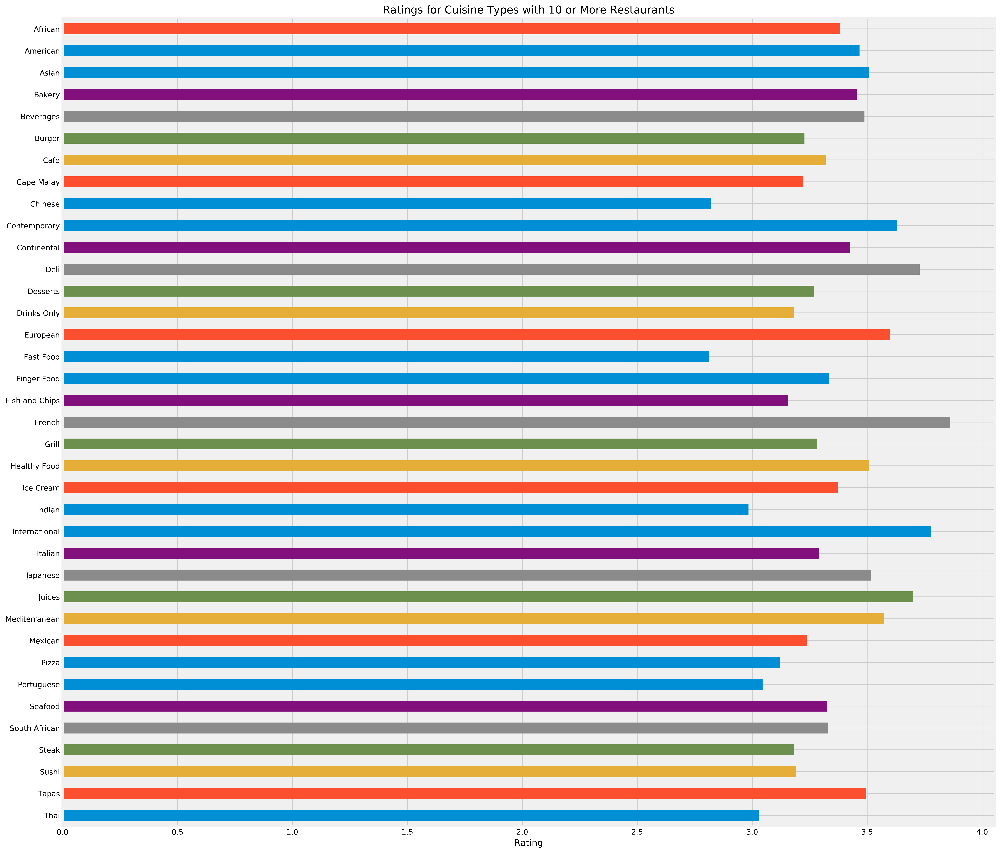

In [46]:
# Find the rating of each cuisine type but only show those cuisines prespresented by more than one restaurant. 

result = {}

for cuisine in get_cuisine_cols():    
    result[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="aggregate_rating")["aggregate_rating"].values
 
cuisine_ratings_df = pd.DataFrame(data=result).T

df = pd.concat([cuisine_ratings_df, data[get_cuisine_cols()].sum()], axis=1)
df = df.sort_index(ascending=False)
df.columns = ["rating", "total"]
df.head(10)

fig, ax = plt.subplots(1, 1, figsize=(20, 20), dpi=400)
ax = df[df.total > 9]["rating"].plot.barh(ax=ax)
ax.set_xlabel("Rating")
ax.set_title("Ratings for Cuisine Types with 10 or More Restaurants")

Text(0.5,1,'Ratings for Cuisine Types with 5 or Less Restaurants')

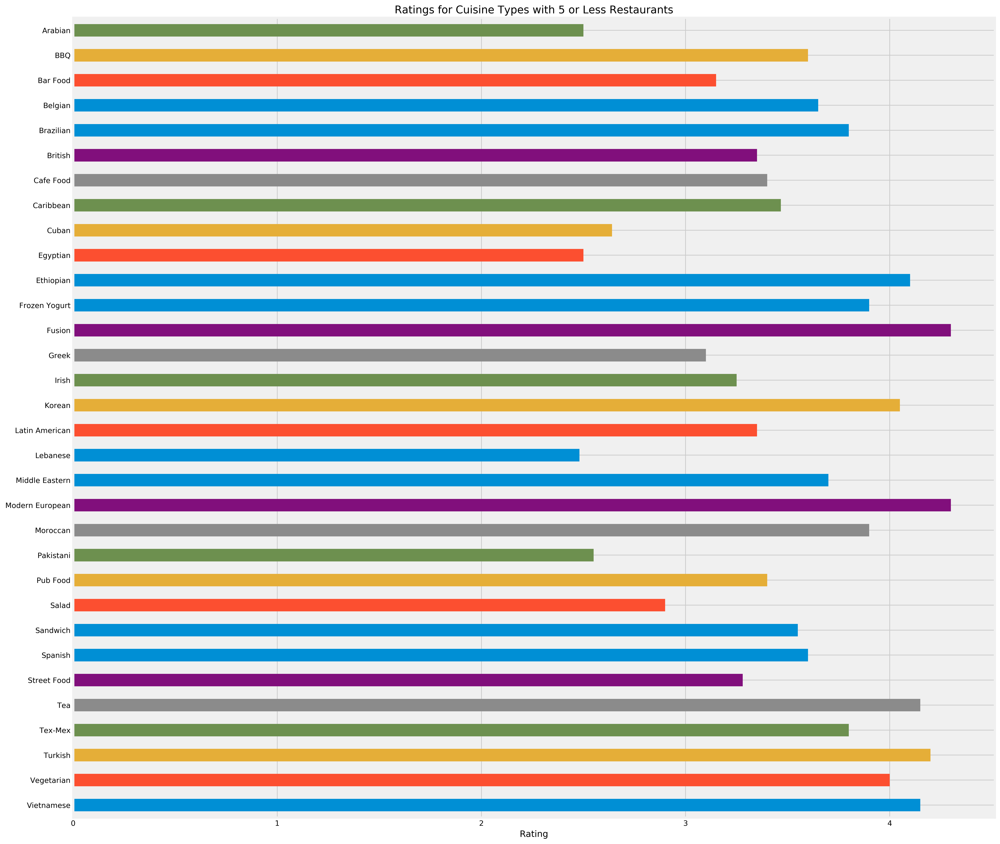

In [47]:
# Find the rating of each cuisine type but only show those cuisines prespresented by more than one restaurant. 

result = {}

for cuisine in get_cuisine_cols():    
    result[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="aggregate_rating")["aggregate_rating"].values
 
cuisine_ratings_df = pd.DataFrame(data=result).T

df = pd.concat([cuisine_ratings_df, data[get_cuisine_cols()].sum()], axis=1)
df = df.sort_index(ascending=False)
df.columns = ["rating", "total"]

fig, ax = plt.subplots(1, 1, figsize=(20, 20), dpi=400)
ax = df[df.total <= 5]["rating"].plot.barh()
ax.set_xlabel("Rating")
ax.set_title("Ratings for Cuisine Types with 5 or Less Restaurants")

Text(0.5,1,'Ratings for Cuisine Types with 1 Restaurant')

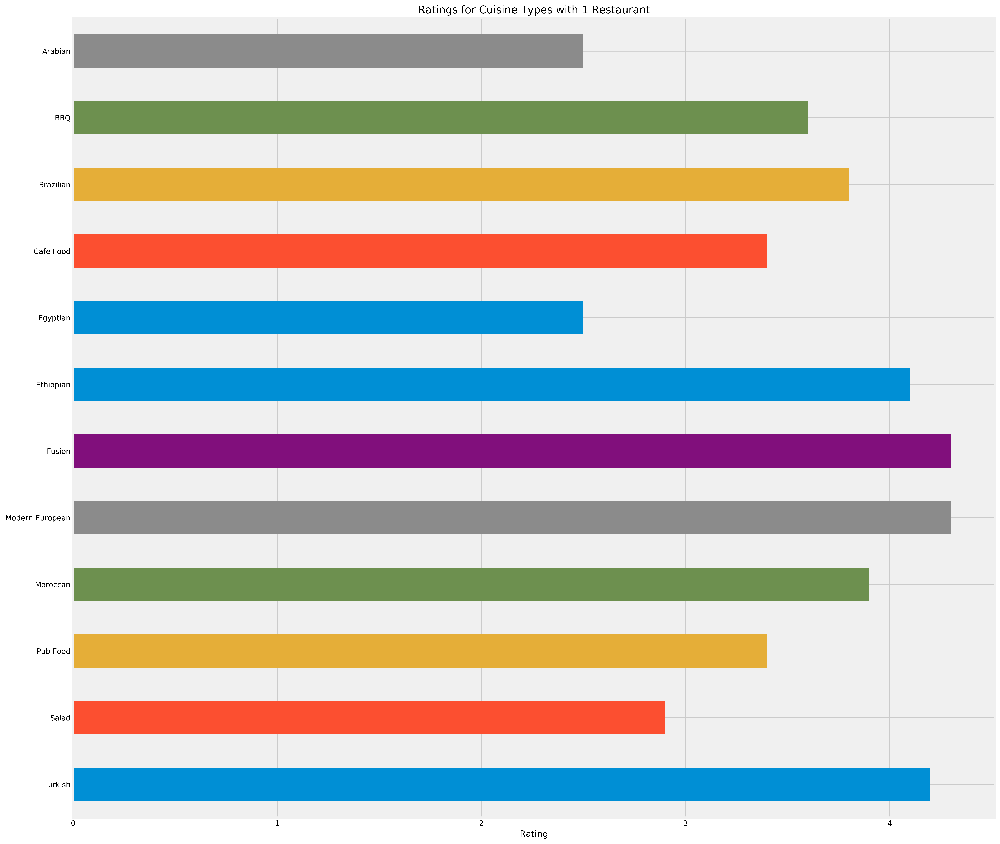

In [48]:
# Find the rating of each cuisine type but only show those cuisines prespresented by more than one restaurant. 

result = {}

for cuisine in get_cuisine_cols():    
    result[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="aggregate_rating")["aggregate_rating"].values
 
cuisine_ratings_df = pd.DataFrame(data=result).T

df = pd.concat([cuisine_ratings_df, data[get_cuisine_cols()].sum()], axis=1)
df = df.sort_index(ascending=False)
df.columns = ["rating", "total"]

fig, ax = plt.subplots(1, 1, figsize=(20, 20), dpi=400)
ax = df[df.total == 1]["rating"].plot.barh()
ax.set_xlabel("Rating")
ax.set_title("Ratings for Cuisine Types with 1 Restaurant")

## Top and Bottom Rated Cuisines by Suburb

In [49]:
result = {}

for cuisine in get_cuisine_cols():    
    result[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="aggregate_rating")["aggregate_rating"].values
 
cuisine_ratings_df = pd.DataFrame(data=result).T

overall_cuisine_ratings = pd.concat([cuisine_ratings_df, data[get_cuisine_cols()].sum()], axis=1)
overall_cuisine_ratings.columns = ["rating", "total"]
overall_cuisine_ratings = df.sort_values(by="rating", ascending=False)
overall_cuisine_ratings.head()

,rating,total
Fusion,4.30,1
Modern European,4.30,1
Turkish,4.20,1
Tea,4.15,2
Vietnamese,4.15,2


In [50]:
top_rated_cuisines = overall_cuisine_ratings[overall_cuisine_ratings.total > 9].head(10).index
top_rated_cuisines

Index(['French', 'International', 'Deli', 'Juices', 'Contemporary', 'European',
       'Mediterranean', 'Japanese', 'Healthy Food', 'Asian'],
      dtype='object')

In [51]:
bottom_rated_cuisines = overall_cuisine_ratings[overall_cuisine_ratings.total > 9].tail(10).index
bottom_rated_cuisines

Index(['Sushi', 'Drinks Only', 'Steak', 'Fish and Chips', 'Pizza',
       'Portuguese', 'Thai', 'Indian', 'Chinese', 'Fast Food'],
      dtype='object')

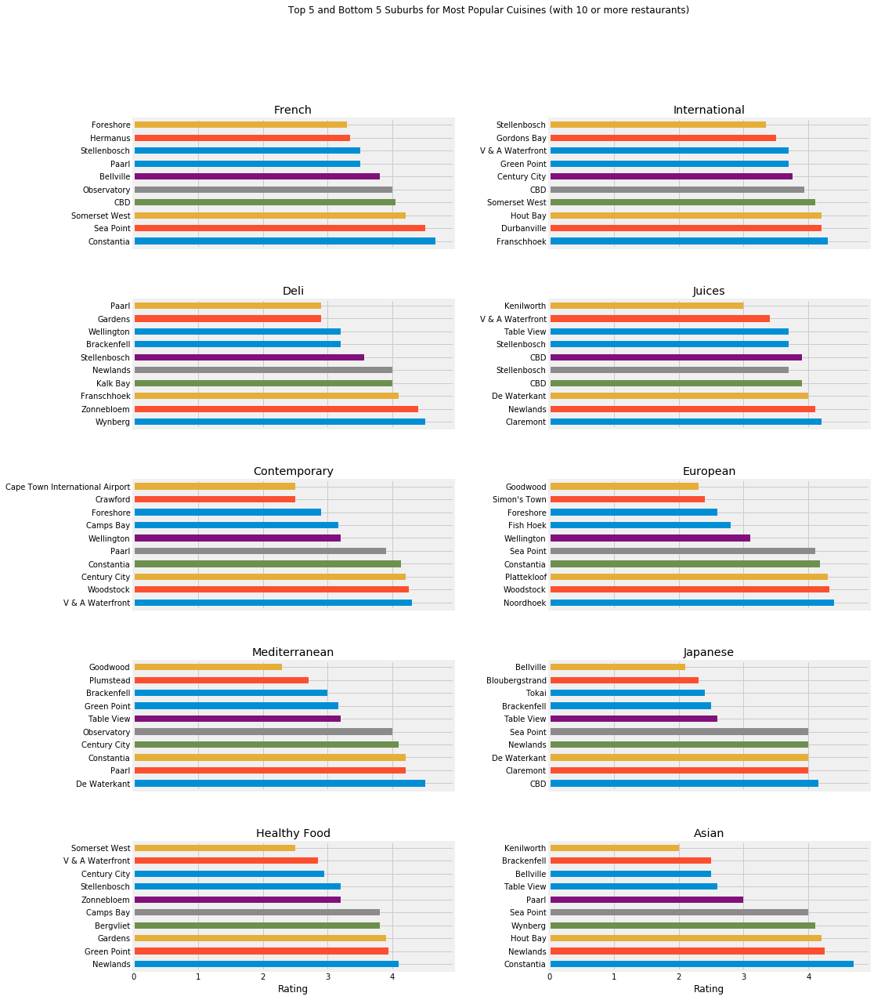

In [52]:
result = {}

for cuisine in get_cuisine_cols():    
    result[cuisine] = data[data[cuisine] == 1].pivot_table(index=[cuisine, "locality"])[["aggregate_rating", "average_cost_for_two"]]

    
fig, ax = plt.subplots(len(top_rated_cuisines)//2, 2, figsize=(15, 20), sharex=True)
plt.suptitle("Top 5 and Bottom 5 Suburbs for Most Popular Cuisines (with 10 or more restaurants)")
fig.subplots_adjust(hspace=0.4, wspace=0.3)
for cuisine, ax in zip(top_rated_cuisines, ax.ravel()):
    df = result[cuisine].pivot_table(index="locality").sort_values(by="aggregate_rating", ascending=False)   
    top = df.head(5)["aggregate_rating"]
    bottom = df.tail(5)["aggregate_rating"]
    ax = pd.concat([top, bottom]).plot.barh(ax=ax)
    ax.set_ylabel("")
    ax.set_title(cuisine)
    ax.set_xlabel("Rating")
#save_fig("top_bottom_suburbs_most_popular_cuisines", tight_layout=False)

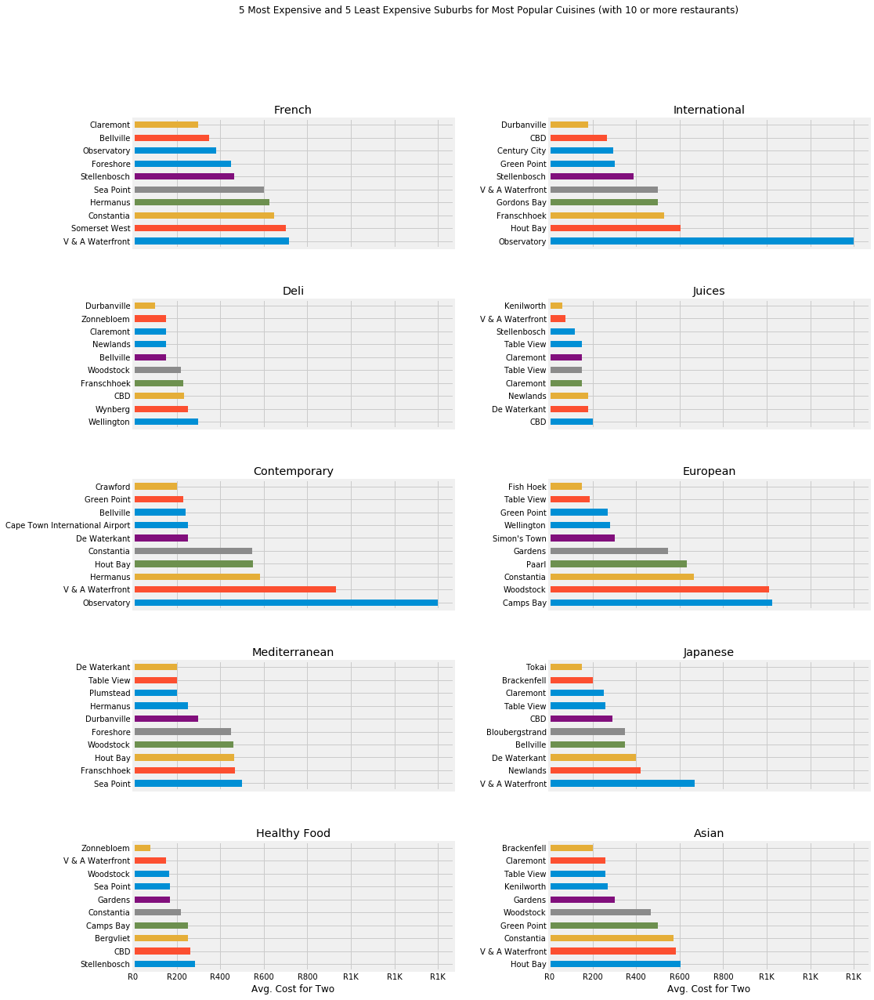

In [53]:
result = {}

for cuisine in get_cuisine_cols():    
    result[cuisine] = data[data[cuisine] == 1].pivot_table(index=[cuisine, "locality"])[["aggregate_rating", "average_cost_for_two"]]

    
fig, ax = plt.subplots(len(top_rated_cuisines)//2, 2, figsize=(15, 20), sharex=True)
plt.suptitle("5 Most Expensive and 5 Least Expensive Suburbs for Most Popular Cuisines (with 10 or more restaurants)")
fig.subplots_adjust(hspace=0.4, wspace=0.3)
for cuisine, ax in zip(top_rated_cuisines, ax.ravel()):
    df = result[cuisine].pivot_table(index="locality").sort_values(by="average_cost_for_two", ascending=False)   
    top = df.head(5)["average_cost_for_two"]
    bottom = df.tail(5)["average_cost_for_two"]
    ax = pd.concat([top, bottom]).plot.barh(ax=ax)
    ax.set_ylabel("")
    ax.set_title(cuisine)
    ax.set_xlabel("Avg. Cost for Two")
    ax.xaxis.set_major_formatter(axes_formatter)
#save_fig("top_bottom_suburbs_most_popular_cuisines", tight_layout=False)

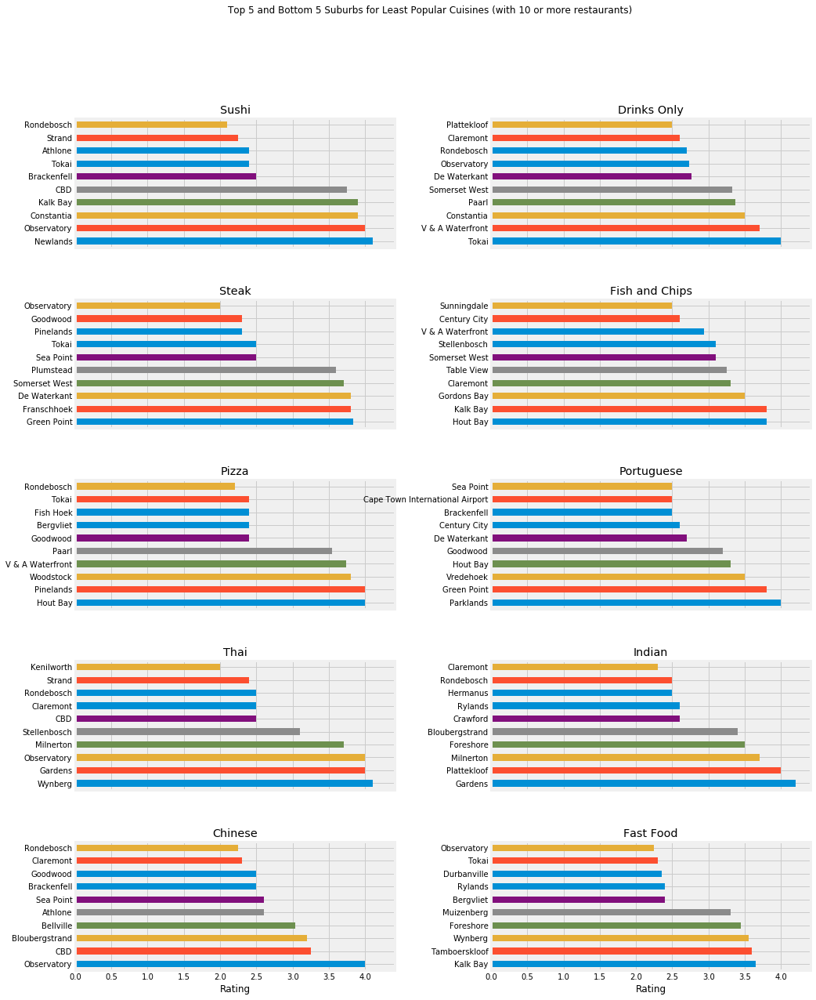

In [54]:
fig, ax = plt.subplots(len(bottom_rated_cuisines)//2, 2, figsize=(15, 20), sharex=True)
plt.suptitle("Top 5 and Bottom 5 Suburbs for Least Popular Cuisines (with 10 or more restaurants)")
fig.subplots_adjust(hspace=0.4, wspace=0.3)
for cuisine, ax in zip(bottom_rated_cuisines, ax.ravel()):
    df = result[cuisine].pivot_table(index="locality").sort_values(by="aggregate_rating", ascending=False) 
    top = df.head(5)["aggregate_rating"]
    bottom = df.tail(5)["aggregate_rating"]
    ax = pd.concat([top, bottom]).plot.barh(ax=ax)
    ax.set_ylabel("")
    ax.set_title(cuisine)
    ax.set_xlabel("Rating")
#save_fig("top_bottom_suburbs_least_popular_cuisines", tight_layout=False)

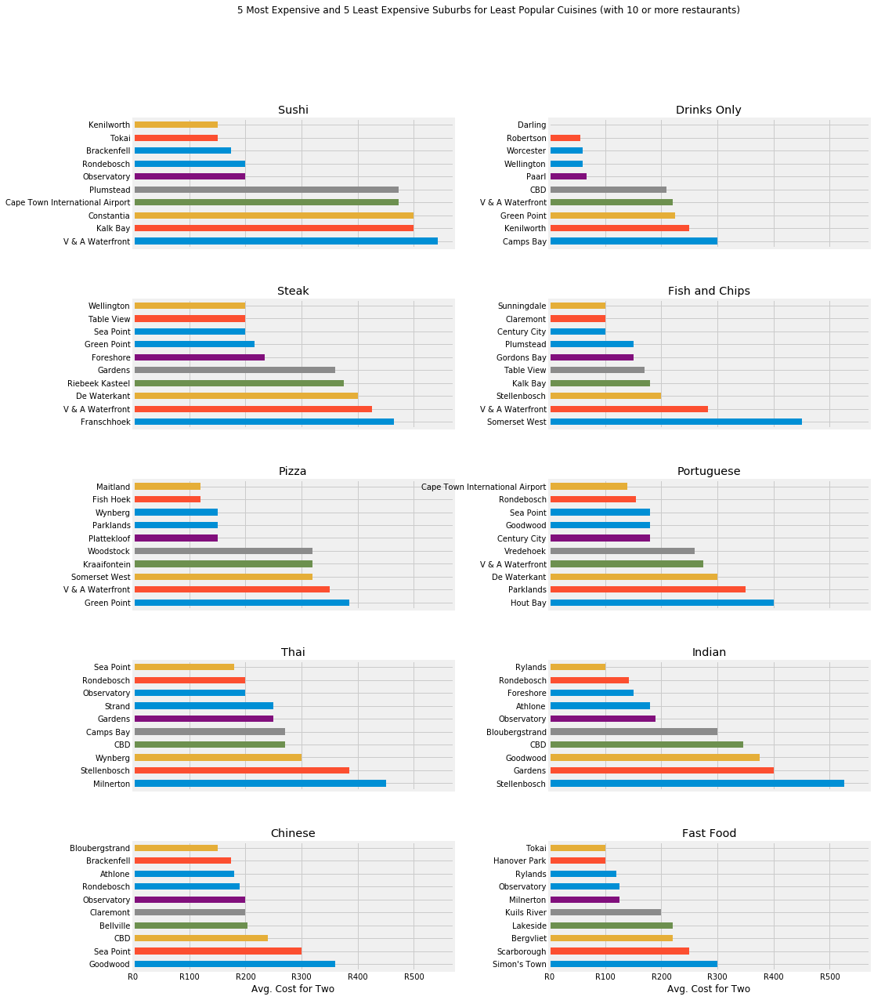

In [55]:
result = {}

for cuisine in get_cuisine_cols():    
    result[cuisine] = data[data[cuisine] == 1].pivot_table(index=[cuisine, "locality"])[["aggregate_rating", "average_cost_for_two"]]

    
fig, ax = plt.subplots(len(bottom_rated_cuisines)//2, 2, figsize=(15, 20), sharex=True)
plt.suptitle("5 Most Expensive and 5 Least Expensive Suburbs for Least Popular Cuisines (with 10 or more restaurants)")
fig.subplots_adjust(hspace=0.4, wspace=0.3)
for cuisine, ax in zip(bottom_rated_cuisines, ax.ravel()):
    df = result[cuisine].pivot_table(index="locality").sort_values(by="average_cost_for_two", ascending=False)   
    top = df.head(5)["average_cost_for_two"]
    bottom = df.tail(5)["average_cost_for_two"]
    ax = pd.concat([top, bottom]).plot.barh(ax=ax)
    ax.set_ylabel("")
    ax.set_title(cuisine)
    ax.set_xlabel("Avg. Cost for Two")
    ax.xaxis.set_major_formatter(axes_formatter)
#save_fig("top_bottom_suburbs_most_popular_cuisines", tight_layout=False)

## Rating vs Cost for Top Rated Suburbs by Cuisine

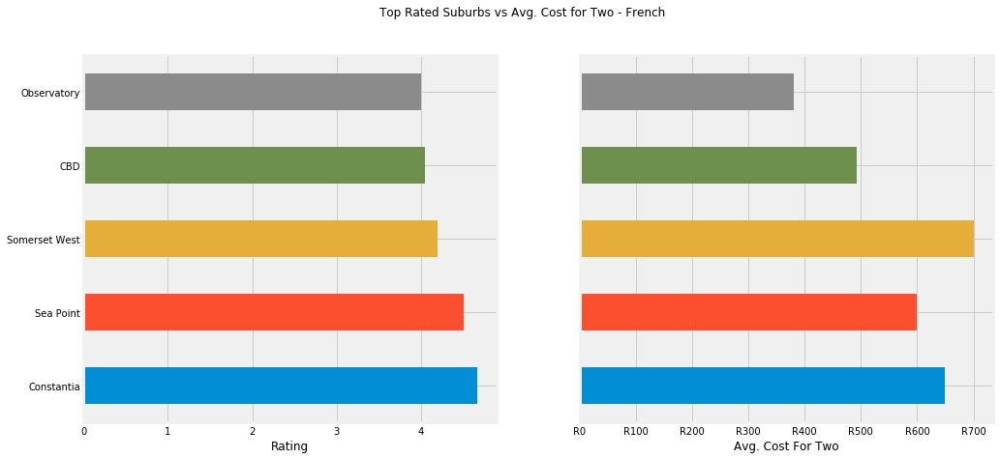

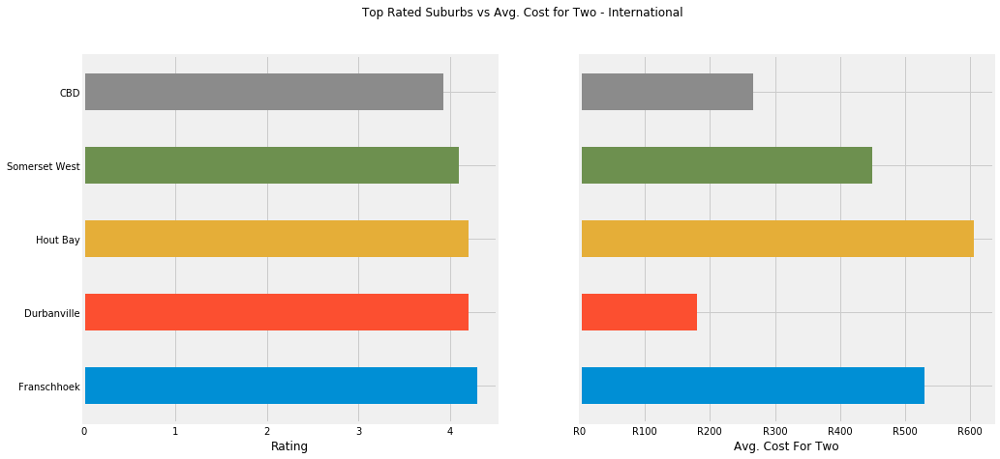

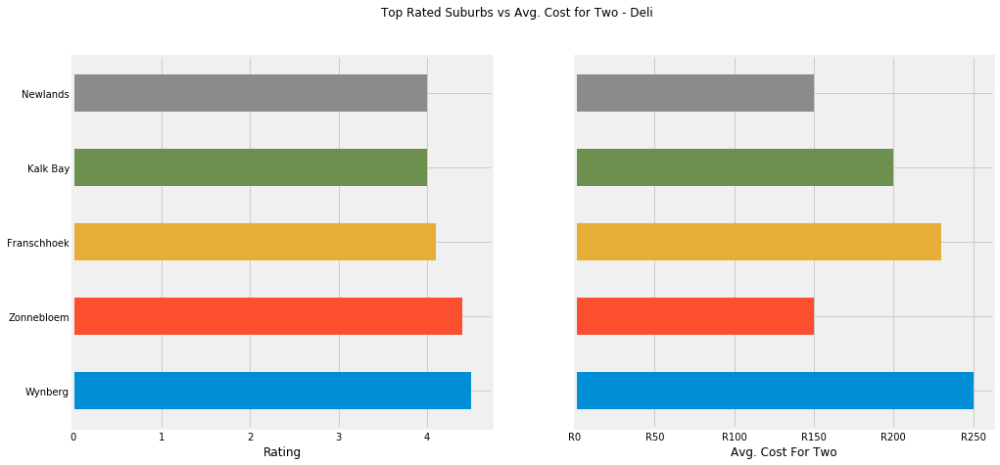

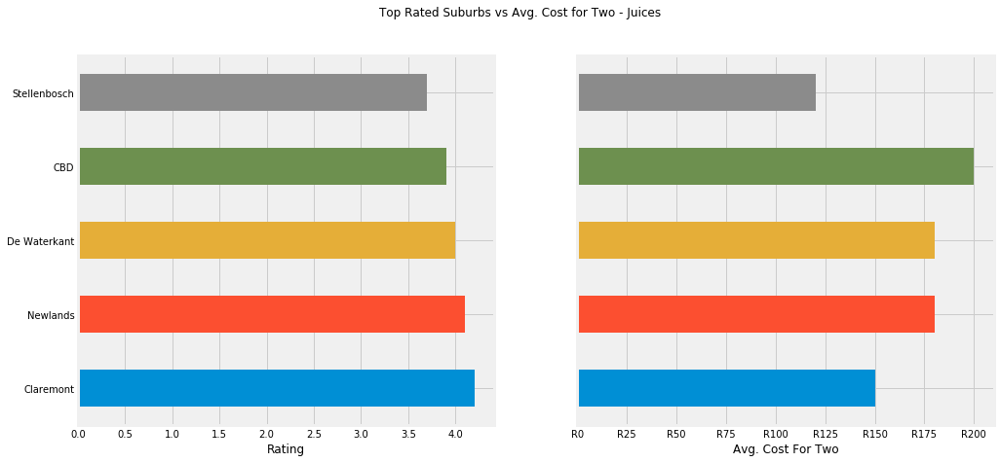

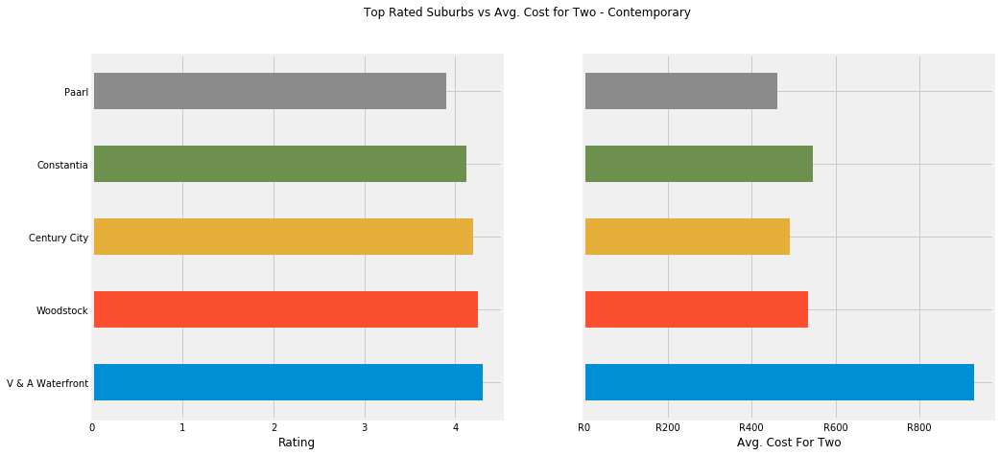

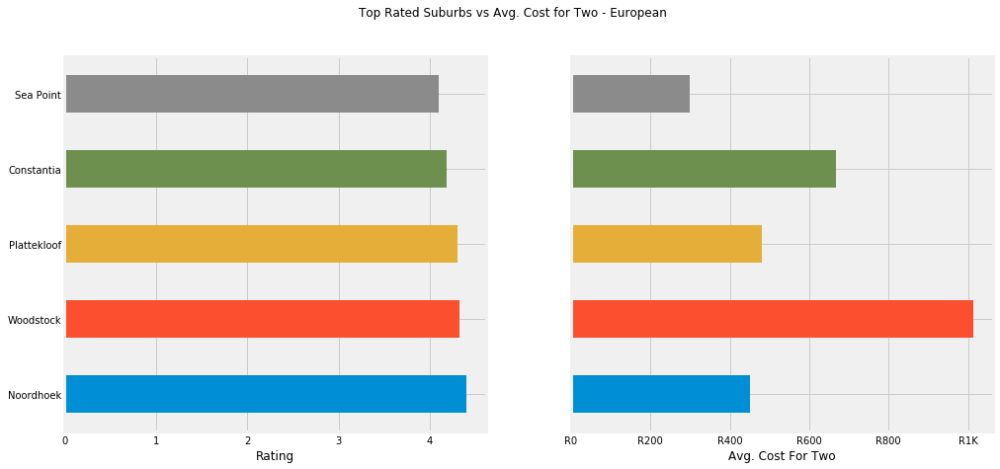

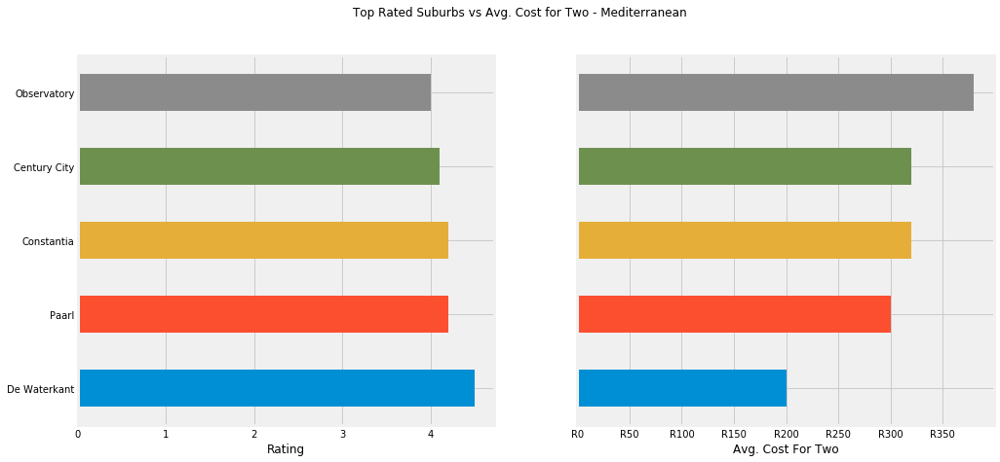

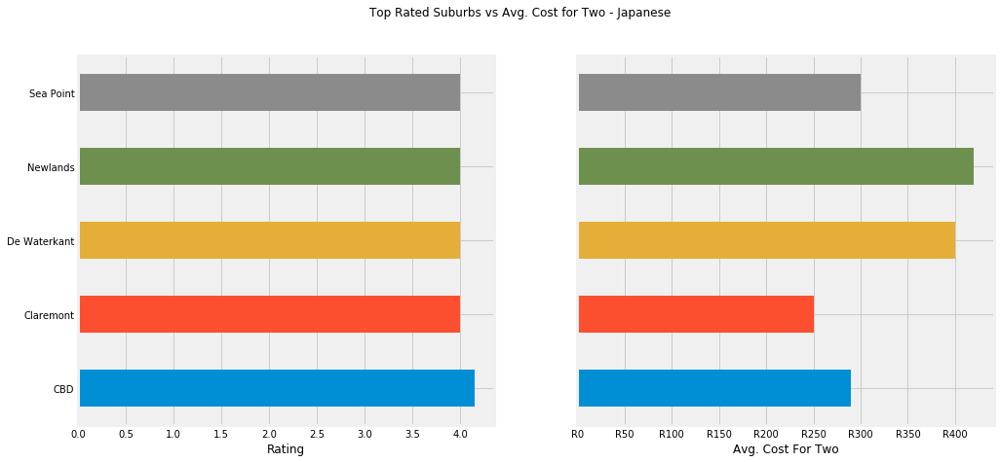

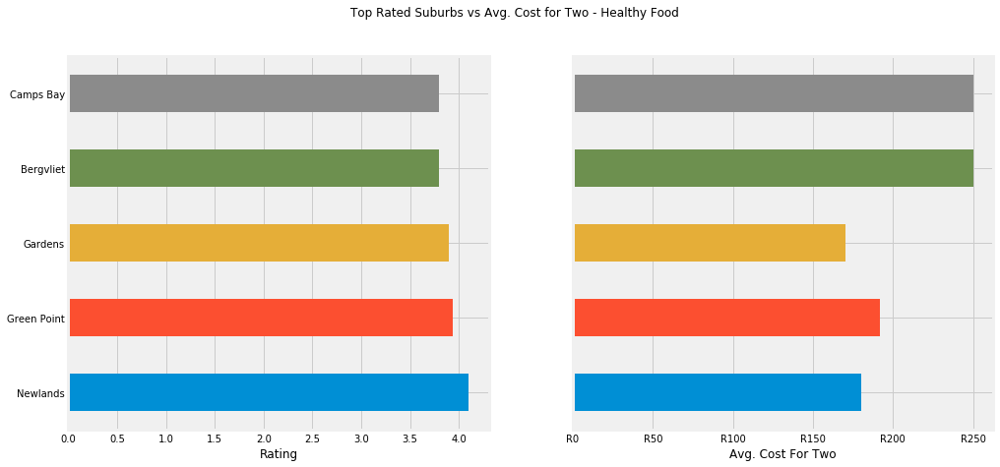

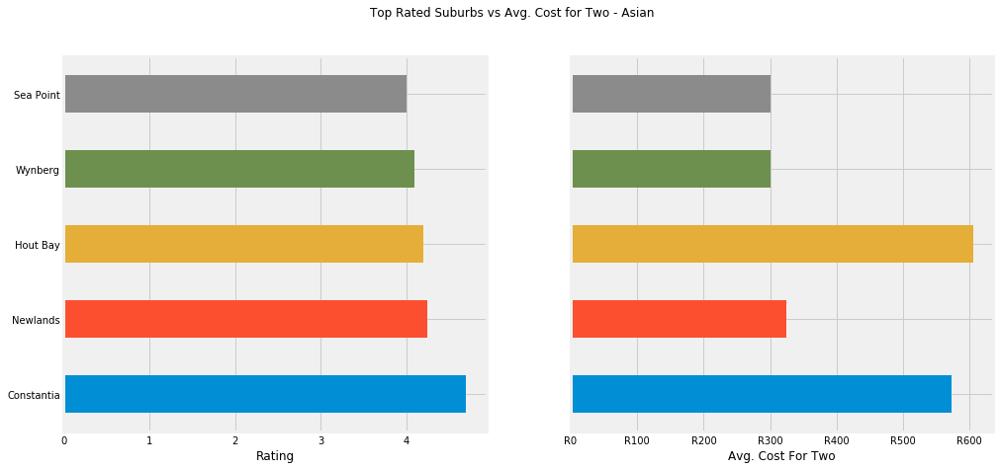

In [56]:
def plot_rating_vs_cost_comparison(cuisine, result, n=5, save_images=False):    
    fig, ax = plt.subplots(1, 2, figsize=(15, 7), sharey=True)
    plt.suptitle("Top Rated Suburbs vs Avg. Cost for Two - " + cuisine)
    df = result[cuisine].pivot_table(index="locality").sort_values(by="aggregate_rating", ascending=False)     
    top = df.head(n)[["aggregate_rating", "average_cost_for_two"]]
    ax1 = top["aggregate_rating"].plot.barh(ax=ax[0])
    ax1.set_ylabel("")    
    ax1.set_xlabel("Rating")

    ax2 = top["average_cost_for_two"].plot.barh(ax=ax[1])
    ax2.set_ylabel("")   
    ax2.set_xlabel("Avg. Cost For Two")
    ax2.xaxis.set_major_formatter(axes_formatter)
    
    if save_images:
        save_fig("rating_vs_cost_" + cuisine, tight_layout=False)
    
result = {}
for cuisine in get_cuisine_cols():    
    result[cuisine] = data[data[cuisine] == 1].pivot_table(index=[cuisine, "locality"])[["aggregate_rating", "average_cost_for_two"]]
    
for cuisine in top_rated_cuisines:
    plot_rating_vs_cost_comparison(cuisine, result, 5, False)

## Comparing Cuisine Ratings vs Cost Overall

Text(0.5,0,'Total Restaurants')

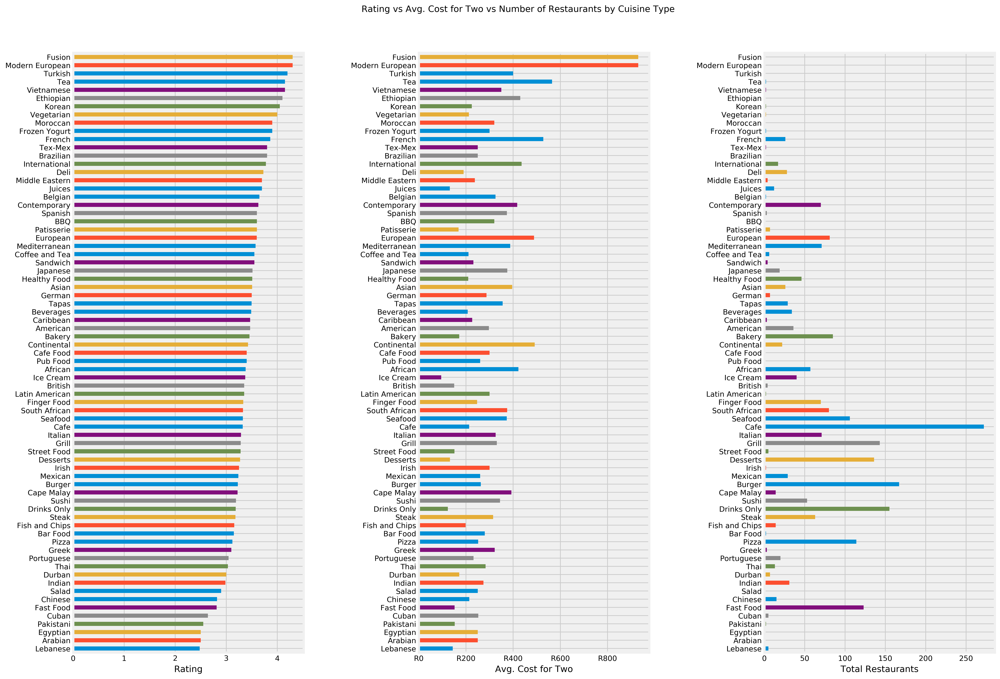

In [57]:
# Find the rating of each cuisine type but only show those cuisines prespresented by more than one restaurant. 

result_rating = {}
result_cost = {}

for cuisine in get_cuisine_cols():    
    result_rating[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="aggregate_rating")["aggregate_rating"].values
    result_cost[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="average_cost_for_two")["average_cost_for_two"].values
 
cuisine_ratings_df = pd.DataFrame(data=result_rating).T
cuisine_costs_df = pd.DataFrame(data=result_cost).T

df = pd.concat([cuisine_ratings_df, cuisine_costs_df, data[get_cuisine_cols()].sum()], axis=1)
df.columns = ["rating", "cost", "total"]
df = df.sort_values(by="rating", ascending=True)

fig, ax = plt.subplots(1, 3, figsize=(20, 15), dpi=400)
fig.subplots_adjust(wspace=0.5)
plt.suptitle("Rating vs Avg. Cost for Two vs Number of Restaurants by Cuisine Type", y=0.94)

ax1 = df[df.total > 0]["rating"].plot.barh(ax=ax.ravel()[0])
ax1.set_xlabel("Rating")
#ax1.set_title("Ratings for Cuisine Types")

ax2 = df[df.total > 0]["cost"].plot.barh(ax=ax.ravel()[1])
ax2.set_xlabel("Avg. Cost for Two")
ax2.xaxis.set_major_formatter(axes_formatter)
#ax2.set_title("Ratings for Cuisine Types")

ax3 = df[df.total > 0]["total"].plot.barh(ax=ax.ravel()[2])
ax3.set_xlabel("Total Restaurants")


Text(0.5,0,'Total Restaurants')

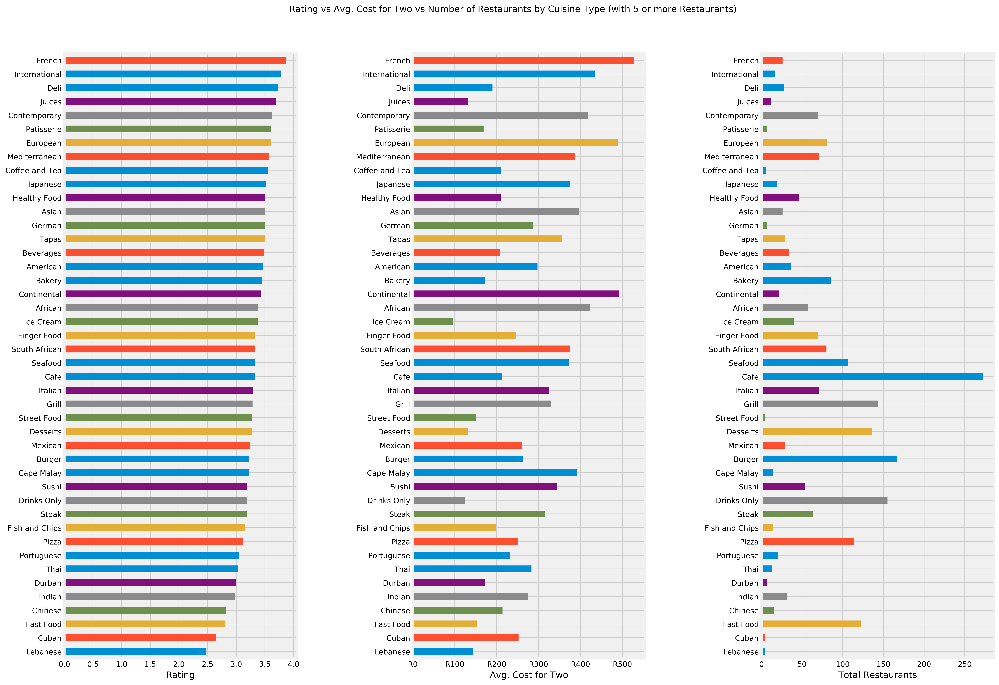

In [58]:
# Find the rating of each cuisine type but only show those cuisines prespresented by more than one restaurant. 

result_rating = {}
result_cost = {}

for cuisine in get_cuisine_cols():    
    result_rating[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="aggregate_rating")["aggregate_rating"].values
    result_cost[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="average_cost_for_two")["average_cost_for_two"].values
 
cuisine_ratings_df = pd.DataFrame(data=result_rating).T
cuisine_costs_df = pd.DataFrame(data=result_cost).T

df = pd.concat([cuisine_ratings_df, cuisine_costs_df, data[get_cuisine_cols()].sum()], axis=1)
df.columns = ["rating", "cost", "total"]
df = df.sort_values(by="rating", ascending=True)

fig, ax = plt.subplots(1, 3, figsize=(20, 15), dpi=400)
fig.subplots_adjust(wspace=0.5)
plt.suptitle("Rating vs Avg. Cost for Two vs Number of Restaurants by Cuisine Type (with 5 or more Restaurants)", y=0.94)

ax1 = df[df.total > 4]["rating"].plot.barh(ax=ax.ravel()[0])
ax1.set_xlabel("Rating")
#ax1.set_title("Ratings for Cuisine Types")

ax2 = df[df.total > 4]["cost"].plot.barh(ax=ax.ravel()[1])
ax2.set_xlabel("Avg. Cost for Two")
ax2.xaxis.set_major_formatter(axes_formatter)
#ax2.set_title("Ratings for Cuisine Types")

ax3 = df[df.total > 4]["total"].plot.barh(ax=ax.ravel()[2])
ax3.set_xlabel("Total Restaurants")


Text(0.5,0,'Total Restaurants')

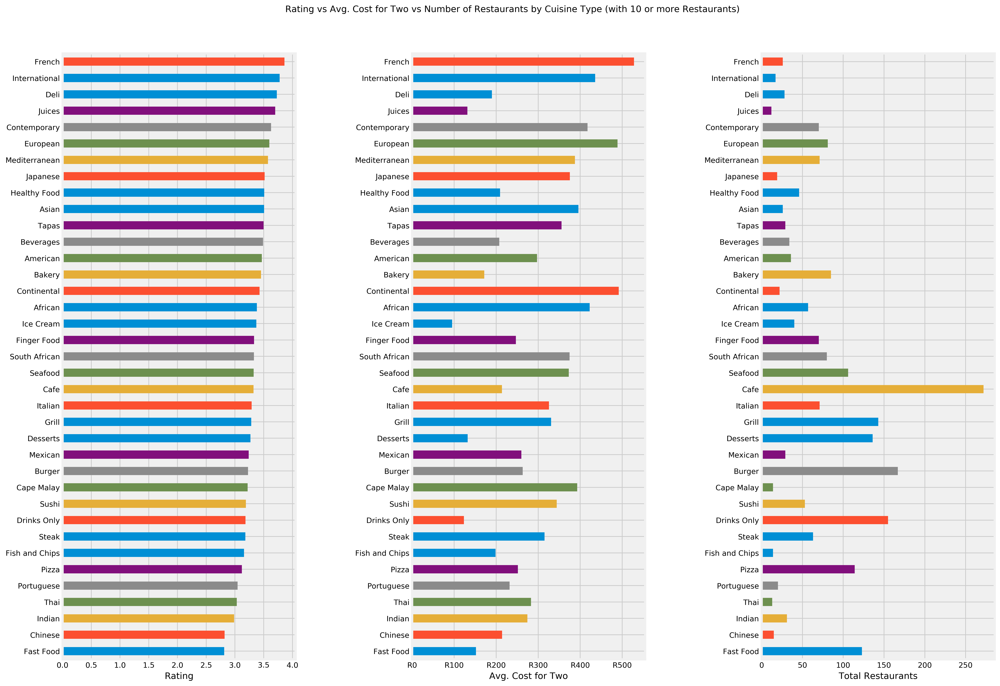

In [59]:
# Find the rating of each cuisine type but only show those cuisines prespresented by more than one restaurant. 

result_rating = {}
result_cost = {}

for cuisine in get_cuisine_cols():    
    result_rating[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="aggregate_rating")["aggregate_rating"].values
    result_cost[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="average_cost_for_two")["average_cost_for_two"].values
 
cuisine_ratings_df = pd.DataFrame(data=result_rating).T
cuisine_costs_df = pd.DataFrame(data=result_cost).T

df = pd.concat([cuisine_ratings_df, cuisine_costs_df, data[get_cuisine_cols()].sum()], axis=1)
df.columns = ["rating", "cost", "total"]
df = df.sort_values(by="rating", ascending=True)

fig, ax = plt.subplots(1, 3, figsize=(20, 15), dpi=400)
fig.subplots_adjust(wspace=0.5)
plt.suptitle("Rating vs Avg. Cost for Two vs Number of Restaurants by Cuisine Type (with 10 or more Restaurants)", y=0.94)

ax1 = df[df.total > 9]["rating"].plot.barh(ax=ax.ravel()[0])
ax1.set_xlabel("Rating")
#ax1.set_title("Ratings for Cuisine Types")

ax2 = df[df.total > 9]["cost"].plot.barh(ax=ax.ravel()[1])
ax2.set_xlabel("Avg. Cost for Two")
ax2.xaxis.set_major_formatter(axes_formatter)
#ax2.set_title("Ratings for Cuisine Types")

ax3 = df[df.total > 9]["total"].plot.barh(ax=ax.ravel()[2])
ax3.set_xlabel("Total Restaurants")


Text(0.5,0,'Total Restaurants')

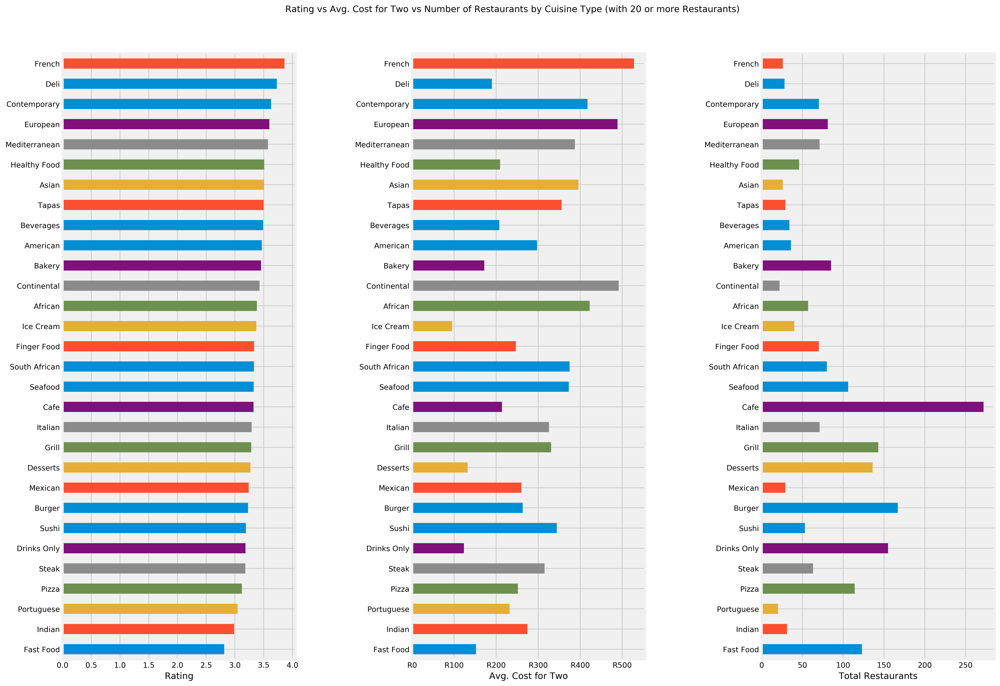

In [60]:
# Find the rating of each cuisine type but only show those cuisines prespresented by more than one restaurant. 

result_rating = {}
result_cost = {}

for cuisine in get_cuisine_cols():    
    result_rating[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="aggregate_rating")["aggregate_rating"].values
    result_cost[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="average_cost_for_two")["average_cost_for_two"].values
 
cuisine_ratings_df = pd.DataFrame(data=result_rating).T
cuisine_costs_df = pd.DataFrame(data=result_cost).T

df = pd.concat([cuisine_ratings_df, cuisine_costs_df, data[get_cuisine_cols()].sum()], axis=1)
df.columns = ["rating", "cost", "total"]
df = df.sort_values(by="rating", ascending=True)

fig, ax = plt.subplots(1, 3, figsize=(20, 15), dpi=400)
fig.subplots_adjust(wspace=0.5)
plt.suptitle("Rating vs Avg. Cost for Two vs Number of Restaurants by Cuisine Type (with 20 or more Restaurants)", y=0.94)

ax1 = df[df.total > 19]["rating"].plot.barh(ax=ax.ravel()[0])
ax1.set_xlabel("Rating")
#ax1.set_title("Ratings for Cuisine Types")

ax2 = df[df.total > 19]["cost"].plot.barh(ax=ax.ravel()[1])
ax2.set_xlabel("Avg. Cost for Two")
ax2.xaxis.set_major_formatter(axes_formatter)
#ax2.set_title("Ratings for Cuisine Types")

ax3 = df[df.total > 19]["total"].plot.barh(ax=ax.ravel()[2])
ax3.set_xlabel("Total Restaurants")


Text(0.5,0,'Total Restaurants')

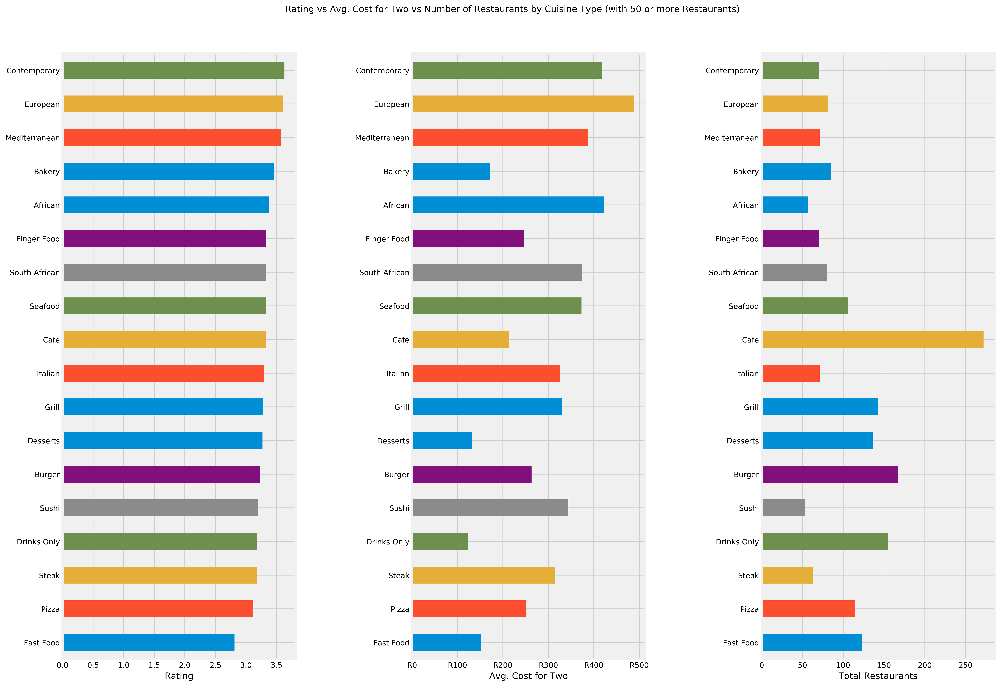

In [61]:
# Find the rating of each cuisine type but only show those cuisines prespresented by more than one restaurant. 

result_rating = {}
result_cost = {}

for cuisine in get_cuisine_cols():    
    result_rating[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="aggregate_rating")["aggregate_rating"].values
    result_cost[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="average_cost_for_two")["average_cost_for_two"].values
 
cuisine_ratings_df = pd.DataFrame(data=result_rating).T
cuisine_costs_df = pd.DataFrame(data=result_cost).T

df = pd.concat([cuisine_ratings_df, cuisine_costs_df, data[get_cuisine_cols()].sum()], axis=1)
df.columns = ["rating", "cost", "total"]
df = df.sort_values(by="rating", ascending=True)

fig, ax = plt.subplots(1, 3, figsize=(20, 15), dpi=400)
fig.subplots_adjust(wspace=0.5)
plt.suptitle("Rating vs Avg. Cost for Two vs Number of Restaurants by Cuisine Type (with 50 or more Restaurants)", y=0.94)

ax1 = df[df.total > 49]["rating"].plot.barh(ax=ax.ravel()[0])
ax1.set_xlabel("Rating")
#ax1.set_title("Ratings for Cuisine Types")

ax2 = df[df.total > 49]["cost"].plot.barh(ax=ax.ravel()[1])
ax2.set_xlabel("Avg. Cost for Two")
ax2.xaxis.set_major_formatter(axes_formatter)
#ax2.set_title("Ratings for Cuisine Types")

ax3 = df[df.total > 49]["total"].plot.barh(ax=ax.ravel()[2])
ax3.set_xlabel("Total Restaurants")


Text(0.5,0,'Total Restaurants')

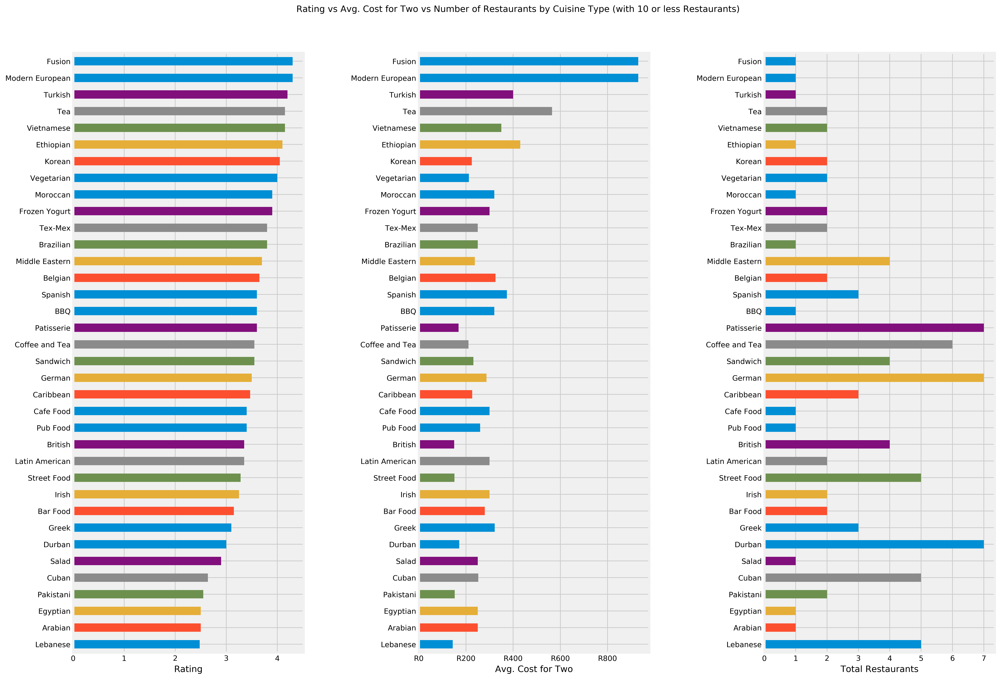

In [62]:
# Find the rating of each cuisine type but only show those cuisines prespresented by more than one restaurant. 

result_rating = {}
result_cost = {}

for cuisine in get_cuisine_cols():    
    result_rating[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="aggregate_rating")["aggregate_rating"].values
    result_cost[cuisine] = data[data[cuisine] == 1].pivot_table(index=cuisine, values="average_cost_for_two")["average_cost_for_two"].values
 
cuisine_ratings_df = pd.DataFrame(data=result_rating).T
cuisine_costs_df = pd.DataFrame(data=result_cost).T

df = pd.concat([cuisine_ratings_df, cuisine_costs_df, data[get_cuisine_cols()].sum()], axis=1)
df.columns = ["rating", "cost", "total"]
df = df.sort_values(by="rating", ascending=True)

fig, ax = plt.subplots(1, 3, figsize=(20, 15), dpi=400)
fig.subplots_adjust(wspace=0.5)
plt.suptitle("Rating vs Avg. Cost for Two vs Number of Restaurants by Cuisine Type (with 10 or less Restaurants)", y=0.94)

ax1 = df[df.total < 11]["rating"].plot.barh(ax=ax.ravel()[0])
ax1.set_xlabel("Rating")
#ax1.set_title("Ratings for Cuisine Types")

ax2 = df[df.total < 11]["cost"].plot.barh(ax=ax.ravel()[1])
ax2.set_xlabel("Avg. Cost for Two")
ax2.xaxis.set_major_formatter(axes_formatter)
#ax2.set_title("Ratings for Cuisine Types")

ax3 = df[df.total < 11]["total"].plot.barh(ax=ax.ravel()[2])
ax3.set_xlabel("Total Restaurants")


In [63]:
# what are common cuisine combos that achieve highest rating?? Perfect for ML algorithm to solve.

## Top 100 Restaurant Trends by Avg. Cost and Suburb

In [64]:
top100 = data.sort_values(by="aggregate_rating", ascending=False).head(100)
top100

,name,aggregate_rating,rating_text,votes,average_cost_for_two,price_range,cuisines,cuisine_count,places,locality,...,Steak,Street Food,Sushi,Tapas,Tea,Tex-Mex,Thai,Turkish,Vegetarian,Vietnamese
0,The Potluck Club,4.9,Excellent,406,600,4,"European, Contemporary",2,Old Biscuit Mill,Woodstock,...,0,0,0,0,0,0,0,0,0,0
1,La Colombe,4.9,Excellent,146,645,4,"French, Asian",2,None,Constantia,...,0,0,0,0,0,0,0,0,0,0
2,Moro Gelato,4.8,Excellent,72,80,1,"Desserts, Ice Cream",2,None,CBD,...,0,0,0,0,0,0,0,0,0,0
3,Unframed Ice Cream,4.7,Excellent,104,40,1,Ice Cream,1,None,Gardens,...,0,0,0,0,0,0,0,0,0,0
4,The Test Kitchen,4.7,Excellent,242,2800,4,"Continental, European",2,Old Biscuit Mill,Woodstock,...,0,0,0,0,0,0,0,0,0,0
5,Jarryds,4.7,Excellent,483,230,3,"Cafe, Burger",2,None,Sea Point,...,0,0,0,0,0,0,0,0,0,0
6,The Velvet Cake Co.,4.6,Excellent,90,165,2,"Bakery, Desserts",2,None,CBD,...,0,0,0,0,0,0,0,0,0,0
7,Foxcroft,4.6,Excellent,103,800,4,"French, Tapas",2,None,Constantia,...,0,0,0,1,0,0,0,0,0,0
8,Chefs Warehouse at Beau Constantia,4.6,Excellent,104,1000,4,"Tapas, Contemporary",2,Beau Constantia Wine Estate,Constantia,...,0,0,0,1,0,0,0,0,0,0
9,Warwick Wine Estate,4.6,Excellent,104,440,4,"South African, Mediterranean, Cafe",3,None,Stellenbosch,...,0,0,0,0,0,0,0,0,0,0


Text(0,0.5,'')

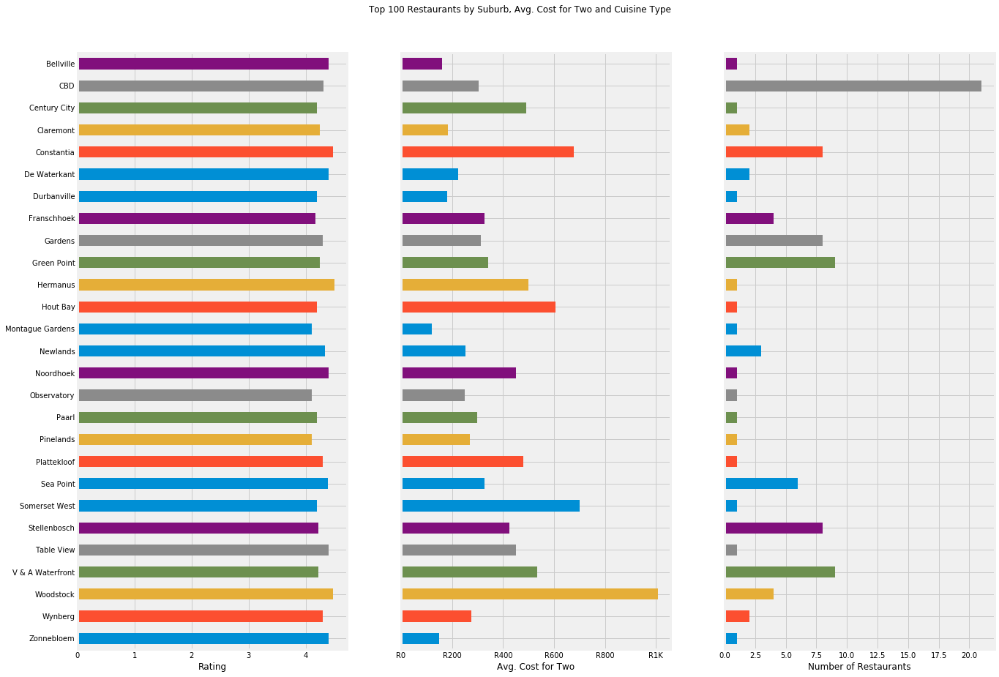

In [65]:
# show a single plot with 3 columns - cuisine type count, avg cost, suburb
top100_locality = top100.pivot_table(index="locality")["aggregate_rating"]
top100_cost = top100.pivot_table(index="locality")["average_cost_for_two"]
top100_count = top100.locality.value_counts()

fig, ax = plt.subplots(1, 3, figsize=(20, 15), sharey=True)
fig.subplots_adjust(wspace=0.2)
plt.suptitle("Top 100 Restaurants by Suburb, Avg. Cost for Two and Cuisine Type", y=0.94)

ax1 = top100_locality.sort_index(ascending=False).plot.barh(ax=ax.ravel()[0])
ax1.set_xlabel("Rating")
ax1.set_ylabel("")

ax2 = top100_cost.sort_index(ascending=False).plot.barh(ax=ax.ravel()[1])
ax2.set_xlabel("Avg. Cost for Two")
ax2.xaxis.set_major_formatter(axes_formatter)
ax2.set_ylabel("")

ax3 = top100_count.sort_index(ascending=False).plot.barh(ax=ax.ravel()[2])
ax3.set_xlabel("Number of Restaurants")
ax3.set_ylabel("")

## Bottom 100 Restaurant Trends by Avg. Cost and Suburb

In [66]:
bottom100 = data.sort_values(by="aggregate_rating", ascending=False).tail(100)
bottom100

,name,aggregate_rating,rating_text,votes,average_cost_for_two,price_range,cuisines,cuisine_count,places,locality,...,Steak,Street Food,Sushi,Tapas,Tea,Tex-Mex,Thai,Turkish,Vegetarian,Vietnamese
1132,Kauai,2.5,Average,13,200,3,"Healthy Food, Fast Food",2,Somerset Mall,Somerset West,...,0,0,0,0,0,0,0,0,0,0
1142,Milky Lane,2.5,Average,16,80,1,"Desserts, Ice Cream",2,Cavendish Square,Claremont,...,0,0,0,0,0,0,0,0,0,0
1149,Lucky Fish & Chips,2.5,Average,38,150,2,"Fast Food, Seafood",2,None,Sea Point,...,0,0,0,0,0,0,0,0,0,0
1143,KFC,2.5,Average,17,150,2,Fast Food,1,Plattekloof Village,Plattekloof,...,0,0,0,0,0,0,0,0,0,0
1153,McDonalds,2.5,Average,7,100,2,Fast Food,1,Tyger Manor,Bellville,...,0,0,0,0,0,0,0,0,0,0
1152,McDonalds,2.5,Average,11,100,2,Fast Food,1,None,CBD,...,0,0,0,0,0,0,0,0,0,0
1150,Kauai,2.5,Average,24,200,3,"Healthy Food, Fast Food",2,None,V & A Waterfront,...,0,0,0,0,0,0,0,0,0,0
1151,McDonalds,2.5,Average,14,100,2,Fast Food,1,None,Kenilworth,...,0,0,0,0,0,0,0,0,0,0
1148,Senhor Calistos,2.5,Average,17,150,2,Fast Food,1,None,Woodstock,...,0,0,0,0,0,0,0,0,0,0
1147,Burger King,2.5,Average,20,140,2,"Burger, Fast Food",2,Tygervalley Shopping Centre,Bellville,...,0,0,0,0,0,0,0,0,0,0


Text(0,0.5,'')

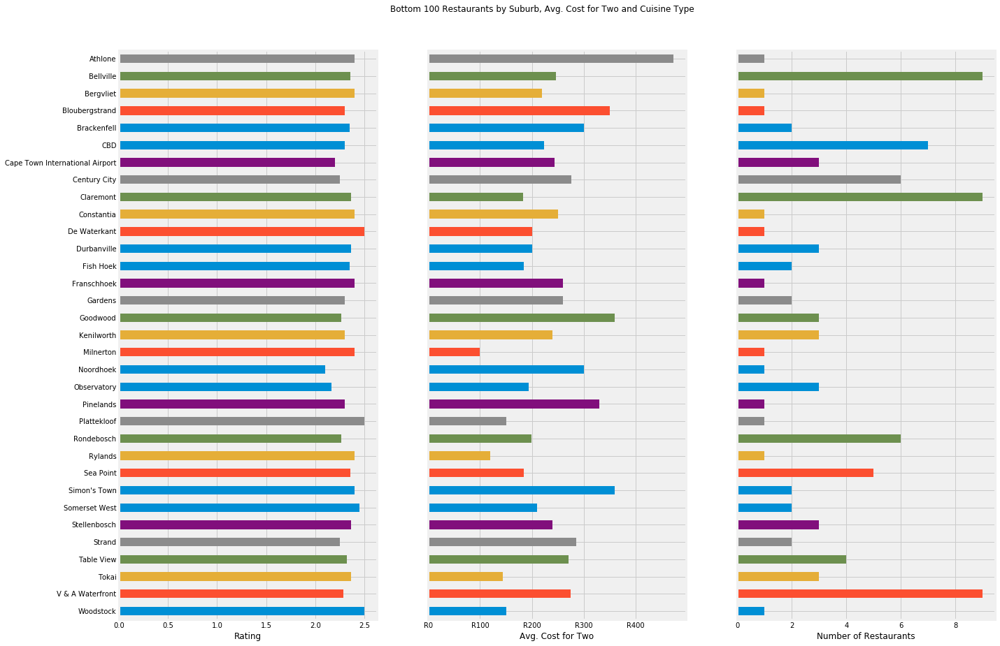

In [67]:
# show a single plot with 3 columns - cuisine type count, avg cost, suburb
bottom100_locality = bottom100.pivot_table(index="locality")["aggregate_rating"]
bottom100_cost = bottom100.pivot_table(index="locality")["average_cost_for_two"]
bottom100_count = bottom100.locality.value_counts()

fig, ax = plt.subplots(1, 3, figsize=(20, 15), sharey=True)
fig.subplots_adjust(wspace=0.2)
plt.suptitle("Bottom 100 Restaurants by Suburb, Avg. Cost for Two and Cuisine Type", y=0.94)

ax1 = bottom100_locality.sort_index(ascending=False).plot.barh(ax=ax.ravel()[0])
ax1.set_xlabel("Rating")
ax1.set_ylabel("")

ax2 = bottom100_cost.sort_index(ascending=False).plot.barh(ax=ax.ravel()[1])
ax2.set_xlabel("Avg. Cost for Two")
ax2.xaxis.set_major_formatter(axes_formatter)
ax2.set_ylabel("")

ax3 = bottom100_count.sort_index(ascending=False).plot.barh(ax=ax.ravel()[2])
ax3.set_xlabel("Number of Restaurants")
ax3.set_ylabel("")

## Top 100 Restaurants by Cuisine, Cost and Suburb

In [68]:
top100.head()

,name,aggregate_rating,rating_text,votes,average_cost_for_two,price_range,cuisines,cuisine_count,places,locality,...,Steak,Street Food,Sushi,Tapas,Tea,Tex-Mex,Thai,Turkish,Vegetarian,Vietnamese
0,The Potluck Club,4.9,Excellent,406,600,4,"European, Contemporary",2,Old Biscuit Mill,Woodstock,...,0,0,0,0,0,0,0,0,0,0
1,La Colombe,4.9,Excellent,146,645,4,"French, Asian",2,None,Constantia,...,0,0,0,0,0,0,0,0,0,0
2,Moro Gelato,4.8,Excellent,72,80,1,"Desserts, Ice Cream",2,None,CBD,...,0,0,0,0,0,0,0,0,0,0
3,Unframed Ice Cream,4.7,Excellent,104,40,1,Ice Cream,1,None,Gardens,...,0,0,0,0,0,0,0,0,0,0
4,The Test Kitchen,4.7,Excellent,242,2800,4,"Continental, European",2,Old Biscuit Mill,Woodstock,...,0,0,0,0,0,0,0,0,0,0


## Ratings of Places (Malls, Wine Estates etc.)

In [69]:
places_counts = data[data.places != "None"]["places"].value_counts()
places_counts

Victoria Wharf                    24
Canal Walk Mall                   24
Cavendish Square                  17
Tygervalley Shopping Centre       13
V & A Foodmarket                  12
Grandwest Casino                  11
Eden On The Bay Centre             6
Bayside Mall                       5
Old Biscuit Mill                   5
Capegate Shopping Center           5
Spier Wine Estate                  4
Spice Route Farm                   4
Vineyard Hotel & Spa               4
The Promenade                      4
Constantia Village                 4
Harfield Village                   4
Westcoast Village                  4
Eikestad Mall                      4
N1 City Mall                       4
Blue Route Mall                    4
The Westin                         4
Somerset Mall                      4
Willowbridge Lifestyle Centre      3
Delaire Graff  Estate              3
Surfers Corner                     3
The Table Bay Hotel                3
One and Only Hotel                 3
G

In [70]:
places_counts.get("12 Apostles Hotel & Spa")

3

In [71]:
def count_restaurants_in_place(row):
    return places_counts.get(row["places"], 0)

places_df = data[data.places != "None"].pivot_table(index="places").reset_index()
places_df["num_restaurants"] = places_df.apply(count_restaurants_in_place, axis=1)
places_df.head()

,places,African,American,Arabian,Asian,BBQ,Bakery,Bar Food,Belgian,Beverages,...,aggregate_rating,average_cost_for_two,cuisine_count,has_online_delivery,has_table_booking,latitude,longitude,price_range,votes,num_restaurants
0,12 Apostles Hotel & Spa,0.0,0.333333,0,0.0,0,0.0,0,0,0.0,...,3.766667,538.333333,2.000000,0,0.0,-33.983533,18.358575,4.000000,68.0,3
1,African Pride 15 on Orange Hotel,0.0,0.000000,0,0.5,0,0.0,0,0,0.0,...,3.350000,400.000000,1.500000,0,0.0,-33.928408,18.414204,4.000000,18.0,2
2,Alphen 5 Star Boutique Hotel,0.0,0.000000,0,0.0,0,0.0,0,0,0.0,...,3.666667,465.000000,1.333333,0,0.0,-34.011406,18.451400,4.000000,47.0,3
3,Anura,0.0,0.000000,0,0.0,0,0.0,0,0,0.0,...,3.100000,193.333333,2.333333,0,0.0,-33.809345,18.886158,2.666667,9.0,3
4,Asara Wine Estate,0.0,0.500000,0,0.0,0,0.0,0,0,0.0,...,3.700000,190.000000,2.000000,0,0.0,-33.943500,18.808500,2.500000,24.5,2


In [72]:
places_df = places_df.set_index(['places'], drop=True)
places_df.head()

,African,American,Arabian,Asian,BBQ,Bakery,Bar Food,Belgian,Beverages,Brazilian,...,aggregate_rating,average_cost_for_two,cuisine_count,has_online_delivery,has_table_booking,latitude,longitude,price_range,votes,num_restaurants
places,,,,,,,,,,,,,,,,,,,,,
12 Apostles Hotel & Spa,0.0,0.333333,0,0.0,0,0.0,0,0,0.0,0,...,3.766667,538.333333,2.000000,0,0.0,-33.983533,18.358575,4.000000,68.0,3
African Pride 15 on Orange Hotel,0.0,0.000000,0,0.5,0,0.0,0,0,0.0,0,...,3.350000,400.000000,1.500000,0,0.0,-33.928408,18.414204,4.000000,18.0,2
Alphen 5 Star Boutique Hotel,0.0,0.000000,0,0.0,0,0.0,0,0,0.0,0,...,3.666667,465.000000,1.333333,0,0.0,-34.011406,18.451400,4.000000,47.0,3
Anura,0.0,0.000000,0,0.0,0,0.0,0,0,0.0,0,...,3.100000,193.333333,2.333333,0,0.0,-33.809345,18.886158,2.666667,9.0,3
Asara Wine Estate,0.0,0.500000,0,0.0,0,0.0,0,0,0.0,0,...,3.700000,190.000000,2.000000,0,0.0,-33.943500,18.808500,2.500000,24.5,2


Text(0,0.5,'')

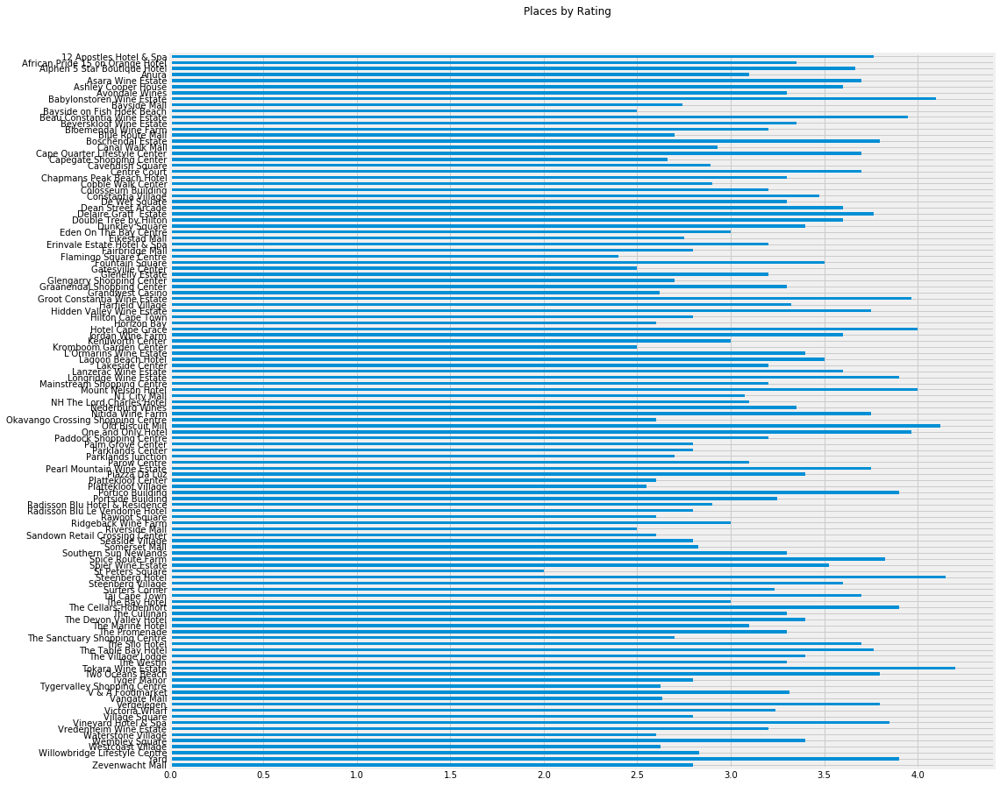

In [73]:
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
#fig.subplots_adjust(wspace=0.2)
plt.suptitle("Places by Rating", y=0.93)
ax = places_df[["aggregate_rating"]].sort_index(ascending=False).plot.barh(ax=ax, legend=False)
ax.set_ylabel("")

Text(0.5,1,'Places by Rating')

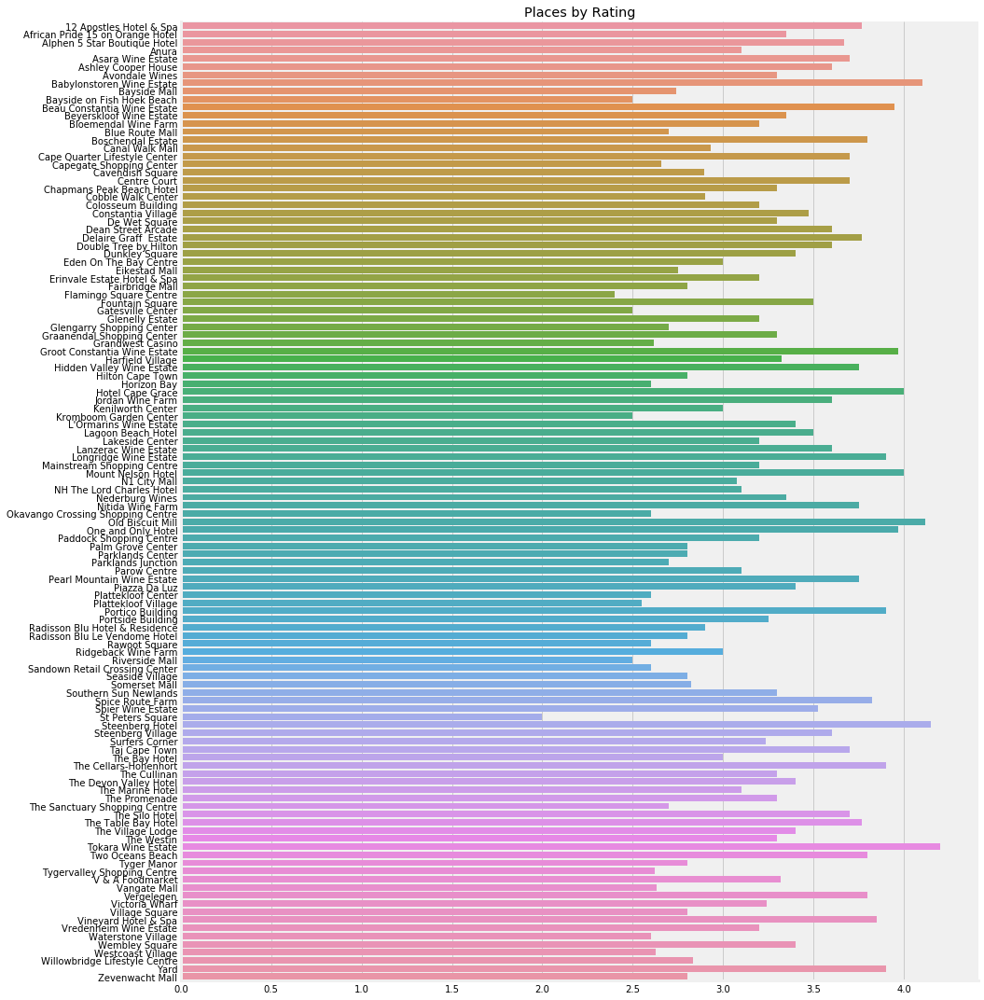

In [74]:
g = sns.catplot(data=places_df.reset_index(), x="aggregate_rating", y="places", kind="bar", height=15)
g.set_axis_labels("", "")
ax = plt.gca()
ax.set_title("Places by Rating")

In [75]:
pd.options.display.max_rows = 999
places_df

,African,American,Arabian,Asian,BBQ,Bakery,Bar Food,Belgian,Beverages,Brazilian,...,aggregate_rating,average_cost_for_two,cuisine_count,has_online_delivery,has_table_booking,latitude,longitude,price_range,votes,num_restaurants
places,,,,,,,,,,,,,,,,,,,,,
12 Apostles Hotel & Spa,0.000000,0.333333,0,0.000000,0,0.000000,0,0,0.000000,0,...,3.766667,538.333333,2.000000,0,0.00,-33.983533,18.358575,4.000000,68.000000,3
African Pride 15 on Orange Hotel,0.000000,0.000000,0,0.500000,0,0.000000,0,0,0.000000,0,...,3.350000,400.000000,1.500000,0,0.00,-33.928408,18.414204,4.000000,18.000000,2
Alphen 5 Star Boutique Hotel,0.000000,0.000000,0,0.000000,0,0.000000,0,0,0.000000,0,...,3.666667,465.000000,1.333333,0,0.00,-34.011406,18.451400,4.000000,47.000000,3
Anura,0.000000,0.000000,0,0.000000,0,0.000000,0,0,0.000000,0,...,3.100000,193.333333,2.333333,0,0.00,-33.809345,18.886158,2.666667,9.000000,3
Asara Wine Estate,0.000000,0.500000,0,0.000000,0,0.000000,0,0,0.000000,0,...,3.700000,190.000000,2.000000,0,0.00,-33.943500,18.808500,2.500000,24.500000,2
Ashley Cooper House,0.000000,0.000000,0,0.000000,0,0.000000,0,0,0.000000,0,...,3.600000,280.000000,4.000000,0,0.00,-33.971667,18.465000,3.000000,123.000000,1
Avondale Wines,0.000000,0.000000,0,0.000000,0,0.000000,0,0,0.000000,0,...,3.300000,800.000000,1.000000,0,0.00,-33.764874,19.000945,4.000000,8.000000,1
Babylonstoren Wine Estate,0.000000,0.000000,0,0.000000,0,0.000000,0,0,0.000000,0,...,4.100000,286.666667,1.000000,0,0.00,-33.826799,18.924695,3.000000,98.333333,3
Bayside Mall,0.000000,0.000000,0,0.000000,0,0.000000,0,0,0.000000,0,...,2.740000,174.000000,1.400000,0,0.00,-33.823122,18.489306,2.400000,13.600000,5


In [76]:
places_type_mapping = {
    "12 Apostles Hotel & Spa" : "Hotel",
    "African Pride 15 on Orange Hotel" : "Hotel",
    "Alphen 5 Star Boutique Hotel" : "Hotel",
    "Asara Wine Estate" : "Wine",
    "Ashley Cooper House" : "Mall",
    "Avondale Wines" : "Wine",
    "Babylonstoren Wine Estate" : "Wine",
    "Bayside Mall" : "Mall",
    "Bayside on Fish Hoek Beach" : "Mall",
    "Beau Constantia Wine Estate" : "Wine",
    "Beyerskloof Wine Estate" : "Wine",
    "Bloemendal Wine Farm" : "Wine",
    "Blue Route Mall" : "Mall",
    "Boschendal Estate" : "Wine",
    "Canal Walk Mall" : "Mall",
    "Cape Quarter Lifestyle Center" : "Mall",
    "Capegate Shopping Center" : "Mall",
    "Cavendish Square" : "Mall",
    "Centre Court" : "Mall",
    "Chapmans Peak Beach Hotel" : "Hotel",
    "Cobble Walk Center" : "Mall",
    "Colosseum Building" : "Apartments",
    "Constantia Village" : "Mall",
    "De Wet Square" : "Mall",
    "Dean Street Arcade" : "Mall",
    "Delaire Graff  Estate" : "Wine",
    "Double Tree by Hilton" : "Hotel",
    "Dunkley Square" : "Mall",
    "Eden On The Bay Centre" : "Mall",
    "Eikestad Mall" : "Mall",
    "Erinvale Estate Hotel & Spa" : "Hotel",
    "Flamingo Square Centre" : "Mall",
    "Fountain Square" : "Mall",
    "Gatesville Center" : "Mall",
    "Glenelly Estate" : "Wine",
    "Glengarry Shopping Center" : "Mall",
    "Graanendal Shopping Center" : "Mall",
    "Grandwest Casino" : "Casino",
    "Groot Constantia Wine Estate" : "Wine",
    "Harfield Village" : "Community",
    "Hidden Valley Wine Estate" : "Wine",
    "Hilton Cape Town" : "Hotel",
    "Horizon Bay" : "Hotel",
    "Hotel Cape Grace" : "Hotel",
    "Jordan Wine Farm" : "Wine",
    "Kenilworth Center" : "Mall",
    "Kromboom Garden Center" : "Mall",
    "L'Ormarins Wine Estate" : "Wine",
    "Lagoon Beach Hotel" : "Hotel",
    "Lakeside Center" : "Mall",
    "Lanzerac Wine Estate" : "Wine",
    "Longridge Wine Estate" : "Wine",
    "Mainstream Shopping Centre" : "Mall",
    "Mount Nelson Hotel" : "Hotel",
    "N1 City Mall" : "Mall",
    "Nederburg Wines" : "Wine",
    "Nitida Wine Farm" : "Wine",
    "Okavango Crossing Shopping Centre" : "Mall",
    "One and Only Hotel" : "Hotel",
    "Paddock Shopping Centre" : "Mall",
    "Palm Grove Center" : "Mall",
    "Parklands Center" : "Mall",
    "Parklands Junction" : "Mall",
    "Parow Centre" : "Mall",
    "Pearl Mountain Wine Estate" : "Wine",
    "Piazza Da Luz" : "Mall",
    "Plattekloof Center" : "Mall",
    "Plattekloof Village" : "Mall",
    "Portico Building" : "Mall",
    "Radisson Blu Hotel & Residence" : "Hotel",
    "Radisson Blu Le Vendome Hotel" : "Hotel",
    "Rawoot Square" : "Mall",
    "Riverside Mall" : "Mall",
    "Sandown Retail Crossing Center" : "Mall",
    "Seaside Village" : "Mall",
    "Somerset Mall" : "Mall",
    "Southern Sun Newlands" : "Hotel",
    "Spice Route Farm" : "Wine",
    "Spier Wine Estate" : "Wine",
    "St Peters Square" : "Mall",
    "Steenberg Hotel" : "Hotel",
    "Steenberg Village" : "Mall",
    "Surfers Corner" : "Apartments",
    "Taj Cape Town" : "Hotel",
    "The Bay Hotel" : "Hotel",
    "The Cellars-Hohenhort" : "Hotel",
    "The Cullinan" : "Hotel",
    "The Devon Valley Hotel" : "Hotel",
    "The Marine Hotel" : "Hotel",
    "The Promenade" : "Mall",
    "The Sanctuary Shopping Centre" : "Mall",
    "The Silo Hotel" : "Hotel",
    "The Table Bay Hotel" : "Hotel",
    "The Village Lodge" : "Hotel",
    "The Westin" : "Hotel",
    "Tokara Wine Estate" : "Wine",
    "Tyger Manor" : "Mall",
    "Tygervalley Shopping Centre" : "Mall",
    "V & A Foodmarket" : "Mall",
    "Vangate Mall" : "Mall",
    "Vergelegen" : "Wine",
    "Victoria Wharf" : "Mall",
    "Village Square" : "Mall",
    "Vineyard Hotel & Spa" : "Hotel",
    "Vredenheim Wine Estate" : "Wine",
    "Waterstone Village" : "Mall",
    "Wembley Square" : "Mall",
    "Westcoast Village" : "Mall",
    "Willowbridge Lifestyle Centre" : "Mall",
    "Yard" : "Mall",
    "Zevenwacht Mall" : "Mall",
    "Anura": "Wine",
    "Fairbridge Mall": "Mall",  
    "NH The Lord Charles Hotel": "Hotel",  
    "Old Biscuit Mill": "Mall",  
    "Portside Building": "Business",  
    "Ridgeback Wine Farm": "Wine",  
    "Two Oceans Beach": "Beach"  
    
}

In [77]:
data[data.locality == "Kalk Bay"]

,name,aggregate_rating,rating_text,votes,average_cost_for_two,price_range,cuisines,cuisine_count,places,locality,...,Steak,Street Food,Sushi,Tapas,Tea,Tex-Mex,Thai,Turkish,Vegetarian,Vietnamese
89,Harbour House Restaurant,4.1,Very Good,160,500,4,"Seafood, Sushi",2,None,Kalk Bay,...,0,0,1,0,0,0,0,0,0,0
153,Olympia Cafe & Deli,4.0,Very Good,162,200,3,"Cafe, Deli",2,None,Kalk Bay,...,0,0,0,0,0,0,0,0,0,0
292,Kalkys,3.8,Good,167,180,2,"Seafood, Fish and Chips, Fast Food",3,None,Kalk Bay,...,0,0,0,0,0,0,0,0,0,0
320,Live Bait,3.7,Good,76,500,4,"Seafood, Sushi, European",3,None,Kalk Bay,...,0,0,1,0,0,0,0,0,0,0
322,The Ice Cafe,3.7,Good,41,45,1,Desserts,1,None,Kalk Bay,...,0,0,0,0,0,0,0,0,0,0
344,Lekker,3.7,Good,75,250,3,"Cafe, South African, European",3,None,Kalk Bay,...,0,0,0,0,0,0,0,0,0,0
475,Lucky Fish & Chips,3.5,Good,24,150,2,"Fast Food, Seafood",2,None,Kalk Bay,...,0,0,0,0,0,0,0,0,0,0


In [78]:
places_df = places_df.reset_index()

def map_places_to_place_type(row):
    return places_type_mapping.get(row['places'], "None")
   

places_df["place_type"] = places_df.apply(map_places_to_place_type, axis=1)
places_df[places_df.place_type == "None"]

,places,African,American,Arabian,Asian,BBQ,Bakery,Bar Food,Belgian,Beverages,...,average_cost_for_two,cuisine_count,has_online_delivery,has_table_booking,latitude,longitude,price_range,votes,num_restaurants,place_type


In [79]:
places_df.place_type.value_counts()

Mall          59
Hotel         28
Wine          25
Apartments     2
Business       1
Beach          1
Community      1
Casino         1
Name: place_type, dtype: int64

In [80]:
places_df.head()

,places,African,American,Arabian,Asian,BBQ,Bakery,Bar Food,Belgian,Beverages,...,average_cost_for_two,cuisine_count,has_online_delivery,has_table_booking,latitude,longitude,price_range,votes,num_restaurants,place_type
0,12 Apostles Hotel & Spa,0.0,0.333333,0,0.0,0,0.0,0,0,0.0,...,538.333333,2.000000,0,0.0,-33.983533,18.358575,4.000000,68.0,3,Hotel
1,African Pride 15 on Orange Hotel,0.0,0.000000,0,0.5,0,0.0,0,0,0.0,...,400.000000,1.500000,0,0.0,-33.928408,18.414204,4.000000,18.0,2,Hotel
2,Alphen 5 Star Boutique Hotel,0.0,0.000000,0,0.0,0,0.0,0,0,0.0,...,465.000000,1.333333,0,0.0,-34.011406,18.451400,4.000000,47.0,3,Hotel
3,Anura,0.0,0.000000,0,0.0,0,0.0,0,0,0.0,...,193.333333,2.333333,0,0.0,-33.809345,18.886158,2.666667,9.0,3,Wine
4,Asara Wine Estate,0.0,0.500000,0,0.0,0,0.0,0,0,0.0,...,190.000000,2.000000,0,0.0,-33.943500,18.808500,2.500000,24.5,2,Wine


In [81]:
places_df = places_df.set_index(['places'], drop=True).sort_index(ascending=False)

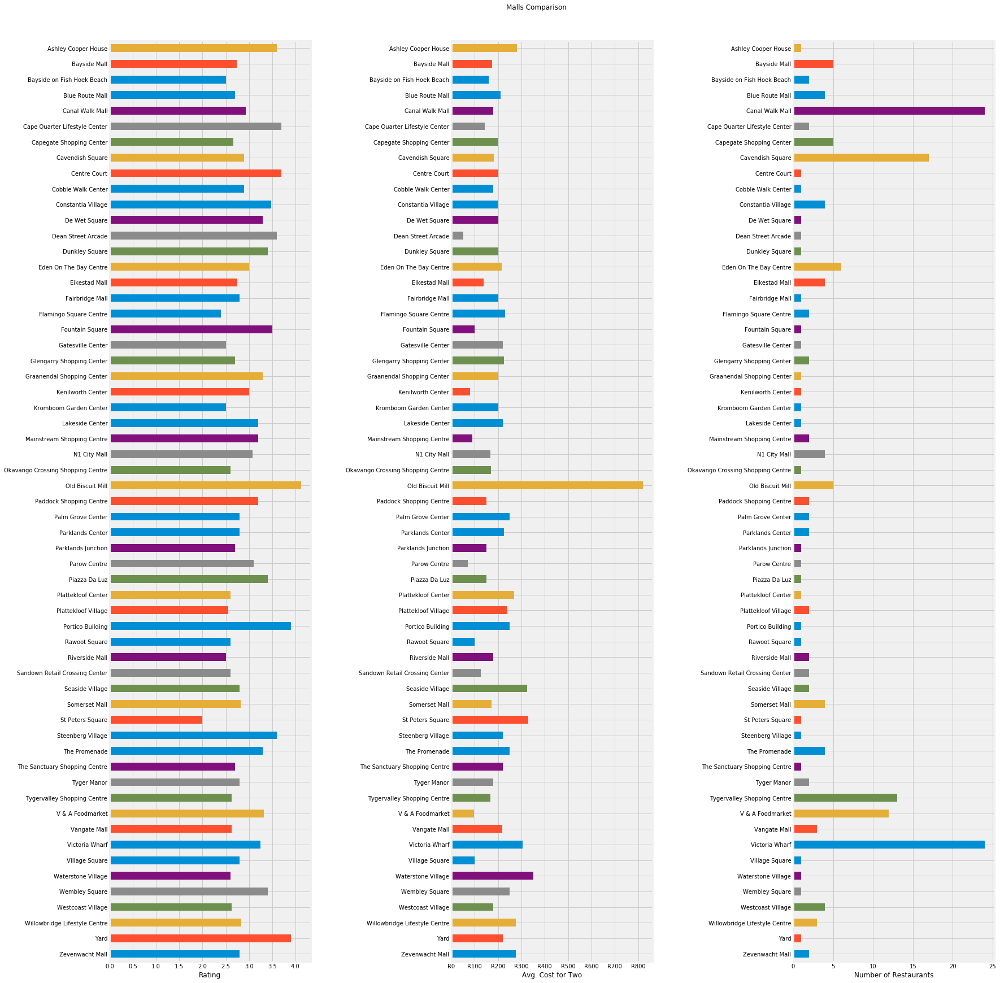

In [82]:
fig, ax = plt.subplots(1, 3, figsize=(25,30))
fig.subplots_adjust(wspace=0.7)

plt.suptitle("Malls Comparison", y=0.91)

ax1 = places_df[places_df.place_type == "Mall"]["aggregate_rating"].plot.barh(ax=ax.ravel()[0])
ax2 = places_df[places_df.place_type == "Mall"]["average_cost_for_two"].plot.barh(ax=ax.ravel()[1])
ax3 = places_df[places_df.place_type == "Mall"]["num_restaurants"].plot.barh(ax=ax.ravel()[2])

ax1.set_xlabel("Rating")
ax1.set_ylabel("")
ax2.set_xlabel("Avg. Cost for Two")
ax2.set_ylabel("")
ax3.set_xlabel("Number of Restaurants")
ax3.set_ylabel("")

ax2.xaxis.set_major_formatter(axes_formatter)

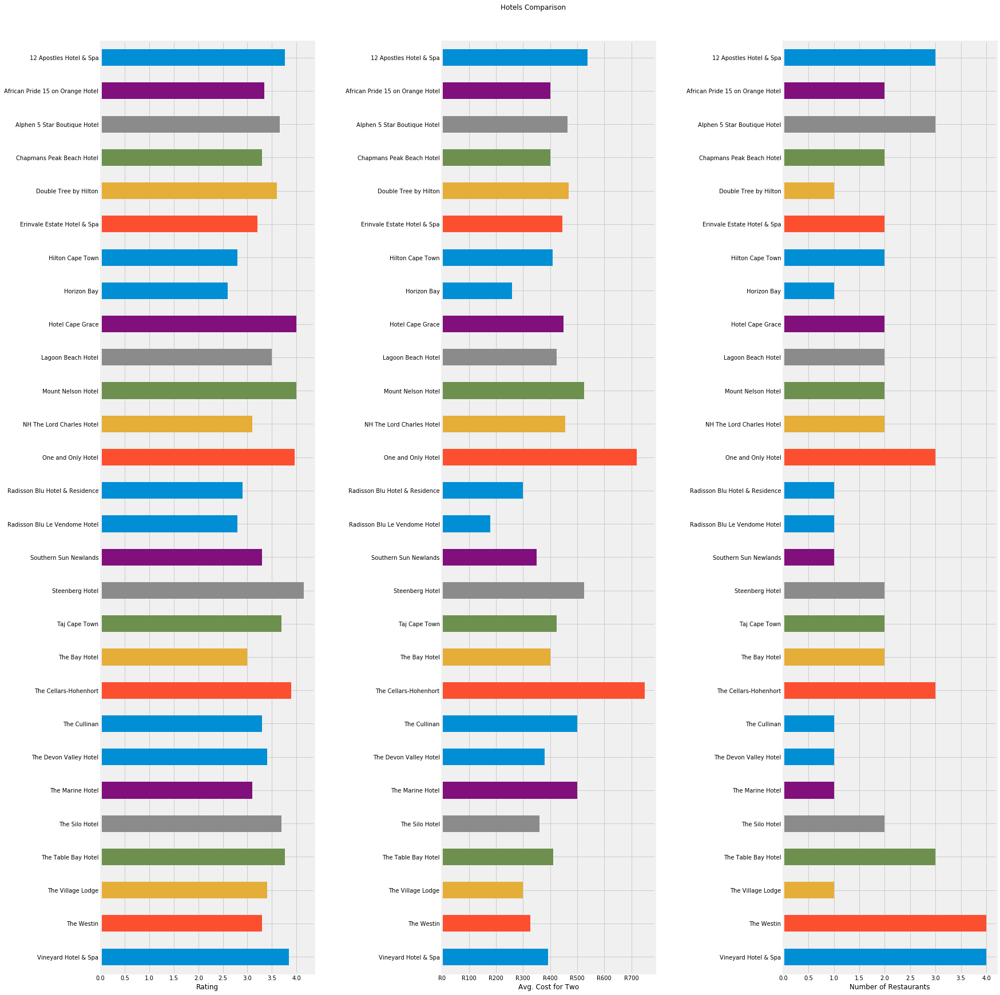

In [83]:
fig, ax = plt.subplots(1, 3, figsize=(25,30))
fig.subplots_adjust(wspace=0.6)

plt.suptitle("Hotels Comparison", y=0.91)

ax1 = places_df[places_df.place_type == "Hotel"]["aggregate_rating"].plot.barh(ax=ax.ravel()[0])
ax2 = places_df[places_df.place_type == "Hotel"]["average_cost_for_two"].plot.barh(ax=ax.ravel()[1])
ax3 = places_df[places_df.place_type == "Hotel"]["num_restaurants"].plot.barh(ax=ax.ravel()[2])

ax1.set_xlabel("Rating")
ax1.set_ylabel("")
ax2.set_xlabel("Avg. Cost for Two")
ax2.set_ylabel("")
ax3.set_xlabel("Number of Restaurants")
ax3.set_ylabel("")

ax2.xaxis.set_major_formatter(axes_formatter)

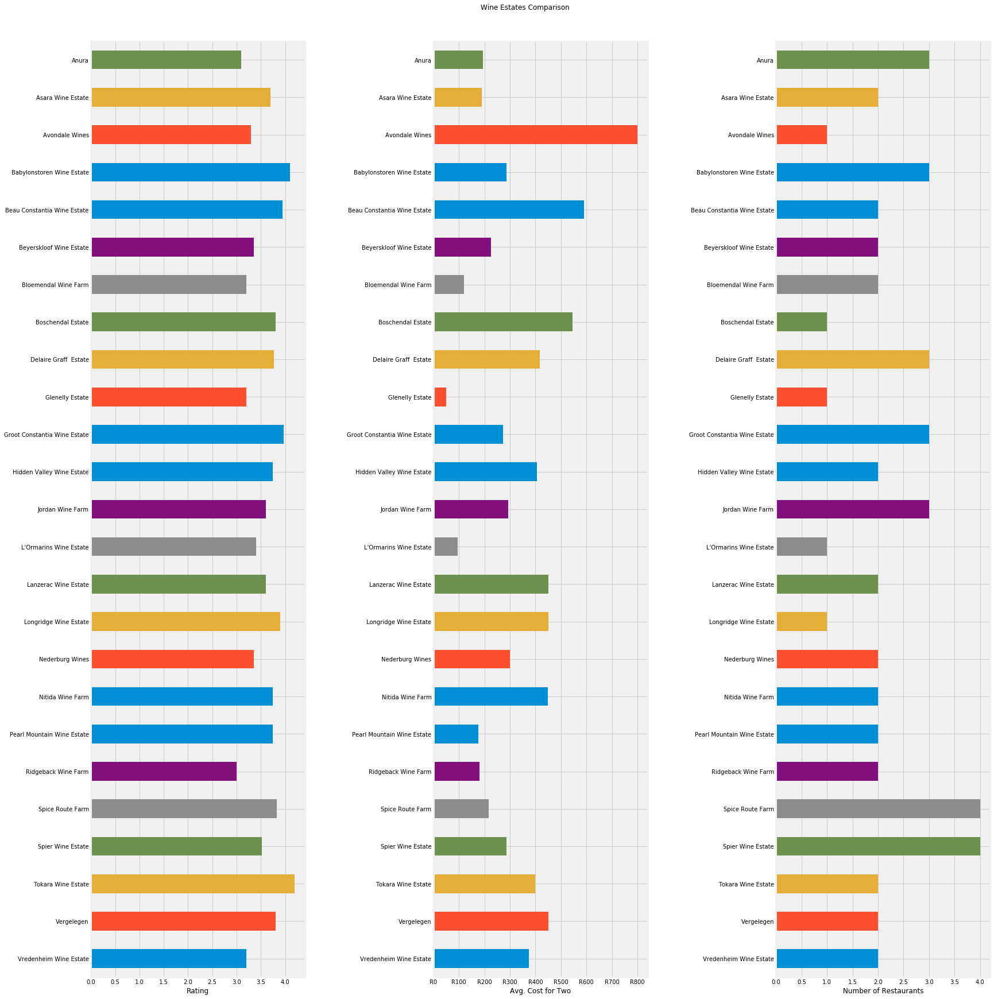

In [84]:
fig, ax = plt.subplots(1, 3, figsize=(25,30))
fig.subplots_adjust(wspace=0.6)

plt.suptitle("Wine Estates Comparison", y=0.91)

ax1 = places_df[places_df.place_type == "Wine"]["aggregate_rating"].plot.barh(ax=ax.ravel()[0])
ax2 = places_df[places_df.place_type == "Wine"]["average_cost_for_two"].plot.barh(ax=ax.ravel()[1])
ax3 = places_df[places_df.place_type == "Wine"]["num_restaurants"].plot.barh(ax=ax.ravel()[2])

ax1.set_xlabel("Rating")
ax1.set_ylabel("")
ax2.set_xlabel("Avg. Cost for Two")
ax2.set_ylabel("")
ax3.set_xlabel("Number of Restaurants")
ax3.set_ylabel("")

ax2.xaxis.set_major_formatter(axes_formatter)

# Geographic Visualisation

In [85]:
import xarray as xr
import pandas as pd
import geoviews as gv
import geoviews.tile_sources as gvts
import geoviews.feature as gf
from bokeh.io import output_notebook
import bokeh.palettes
from bokeh.models import LinearColorMapper, BasicTicker, ColorBar
from bokeh.plotting import figure, output_file, show
import geoviews.tile_sources as gts
import holoviews as hv

from cartopy import crs as ccrs

#hv.notebook_extension("matplotlib")
gv.extension('bokeh')

output_notebook()

ModuleNotFoundError: No module named 'xarray'

## Rating by Price Range

In [ ]:
ratings = gv.Dataset(data, kdims=['name', 'votes', 'price_range', 'average_cost_for_two'])

points = ratings.redim(aggregate_rating=dict(range=(0, 5))).to(gv.Points, ['longitude', 'latitude'], 
                    ['aggregate_rating', 'name', 'votes', 'cuisine_count', 'average_cost_for_two'])
(gts.Wikipedia * points.options(width=700, height=500, 
                                tools=['hover', 'save', 'zoom_in', 'zoom_out', 'pan' , 'wheel_zoom'],
                                colorbar=True, toolbar='above', xaxis=None, yaxis=None,
                                size_index=4, color_index=2, size=1, 
                                cmap=bokeh.palettes.all_palettes['Dark2'][5])).redim(longitude="Longitude",
                                                                                                latitude="Latitude",
                                                                                                aggregate_rating='Rating', 
                                                                                                name='Name',
                                                                                               votes="Votes",
                                                                                               price_range="Price Range",
                                                                                               average_cost_for_two="Avg. Cost for 2 (R)",
                                                                                               cuisine_count="No. Cuisines"
                                                                                            )


In [ ]:
ratings = gv.Dataset(data, kdims=['name', 'votes', 'price_range', 'cuisine_count', 'average_cost_for_two'])

points = ratings.redim(aggregate_rating=dict(range=(0, 5))).to(gv.Points, ['longitude', 'latitude'], 
                    ['name', 'aggregate_rating', 'average_cost_for_two', 'votes', 'cuisine_count' ])
(gts.Wikipedia * points.options(width=700, height=500, 
                                tools=['hover', 'save', 'zoom_in', 'zoom_out', 'pan' , 'wheel_zoom'],
                                colorbar=True, toolbar='above', xaxis=None, yaxis=None,
                                size_index=4, color_index=2, size=1, 
                                cmap=bokeh.palettes.all_palettes['Dark2'][5])).redim(longitude="Longitude",
                                                                                                latitude="Latitude",
                                                                                                aggregate_rating='Rating', 
                                                                                                name='Name',
                                                                                               votes="Votes",
                                                                                               price_range="Price Range",
                                                                                               average_cost_for_two="Avg. Cost for 2 (R)",
                                                                                               cuisine_count="No. Cuisines"
                                                                                            )
## Ratings by Cuisine Count

In [ ]:
top100_cuisines = [cuisine for cuisine in get_cuisine_cols() if top100[cuisine].sum() > 0]
bottom100_cuisines = [cuisine for cuisine in get_cuisine_cols() if bottom100[cuisine].sum() > 0]

In [ ]:
ratings = gv.Dataset(data, kdims=['name', 'votes', 'cuisine_count', 'average_cost_for_two'])

points = ratings.redim(aggregate_rating=dict(range=(0, 5))).to(gv.Points, ['longitude', 'latitude'], 
                    ['aggregate_rating', 'name', 'average_cost_for_two', 'votes', 'cuisine_count' ])
(gts.Wikipedia * points.options(width=700, height=500, 
                                tools=['hover', 'save', 'zoom_in', 'zoom_out', 'pan' , 'wheel_zoom'],
                                colorbar=True, toolbar='above', xaxis=None, yaxis=None,
                                size_index=2, color_index=2, size=1, 
                                cmap=bokeh.palettes.all_palettes['Dark2'][5])).redim(longitude="Longitude",
                                                                                                latitude="Latitude",
                                                                                                aggregate_rating='Rating', 
                                                                                                name='Name',
                                                                                               votes="Votes",
                                                                                               price_range="Price Range",
                                                                                               average_cost_for_two="Avg. Cost for 2 (R)",
                                                                                               cuisine_count="No. Cuisines"
                                                                                            )
## Ratings by Cuisine Count

## Building Geographic Ward-Level Maps for Cape Town and Stellenbosch

Ward data sourced from http://www.demarcation.org.za/index.php/downloads/boundary-data

In [220]:
import geopandas as gpd
fp = "geo-spatial/Wards2011.shp"
wards_sa = gpd.read_file(fp)
print(wards_sa.shape)
wards_sa.head()

(4277, 10)


,PROVINCE,CAT_B,MUNICNAME,WARDNO,WARD_ID,WARD_POP,Area,Shape_Leng,Shape_Area,geometry
0,Western Cape,WC011,Matzikama Local Municipality,1,10101001,3197,113.945188,0.730074,0.010829,POLYGON ((18.29086898800006 -31.52614444199997...
1,Western Cape,WC011,Matzikama Local Municipality,2,10101002,3256,467.354973,1.360033,0.044463,POLYGON ((18.22450099700006 -31.56811899799993...
2,Western Cape,WC011,Matzikama Local Municipality,3,10101003,3268,201.121780,0.749417,0.019106,POLYGON ((18.55321699600006 -31.59578699999997...
3,Western Cape,WC011,Matzikama Local Municipality,4,10101004,3110,34.669564,0.335238,0.003297,POLYGON ((18.58101300400006 -31.65973900099993...
4,Western Cape,WC011,Matzikama Local Municipality,5,10101005,3122,541.407537,1.473706,0.051575,POLYGON ((18.51915739400005 -31.66599466499997...


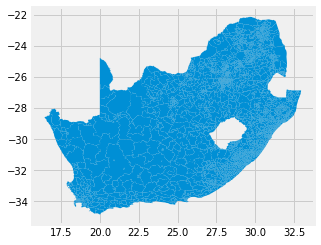

In [221]:
wards_sa.plot()

In [222]:
wards_wc = wards_sa[wards_sa.PROVINCE == "Western Cape"]
print(wards_wc.shape)
wards_wc.head()

(387, 10)


,PROVINCE,CAT_B,MUNICNAME,WARDNO,WARD_ID,WARD_POP,Area,Shape_Leng,Shape_Area,geometry
0,Western Cape,WC011,Matzikama Local Municipality,1,10101001,3197,113.945188,0.730074,0.010829,POLYGON ((18.29086898800006 -31.52614444199997...
1,Western Cape,WC011,Matzikama Local Municipality,2,10101002,3256,467.354973,1.360033,0.044463,POLYGON ((18.22450099700006 -31.56811899799993...
2,Western Cape,WC011,Matzikama Local Municipality,3,10101003,3268,201.121780,0.749417,0.019106,POLYGON ((18.55321699600006 -31.59578699999997...
3,Western Cape,WC011,Matzikama Local Municipality,4,10101004,3110,34.669564,0.335238,0.003297,POLYGON ((18.58101300400006 -31.65973900099993...
4,Western Cape,WC011,Matzikama Local Municipality,5,10101005,3122,541.407537,1.473706,0.051575,POLYGON ((18.51915739400005 -31.66599466499997...


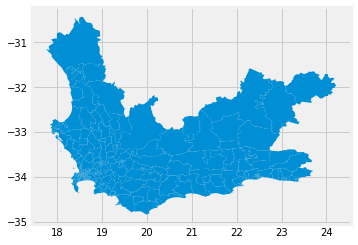

In [223]:
wards_wc.plot()

In [224]:
wards_wc.MUNICNAME.value_counts()

City of Cape Town Metropolitan Municipality    111
Drakenstein Local Municipality                  31
George Local Municipality                       25
Stellenbosch Local Municipality                 22
Breede Valley Local Municipality                21
Mossel Bay Local Municipality                   14
Theewaterskloof Local Municipality              13
Overstrand Local Municipality                   13
Oudtshoorn Local Municipality                   13
Saldanha Bay Local Municipality                 13
Langeberg Local Municipality                    12
Swartland Local Municipality                    12
Witzenberg Local Municipality                   12
Knysna Local Municipality                       10
Hessequa Local Municipality                      8
Matzikama Local Municipality                     8
Bitou Local Municipality                         7
Bergrivier Local Municipality                    7
Beaufort West Local Municipality                 7
Cederberg Local Municipality   

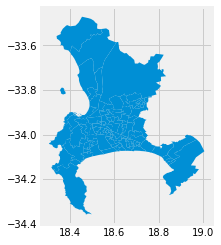

In [225]:
wards_wc[wards_wc.MUNICNAME == "City of Cape Town Metropolitan Municipality"].plot()

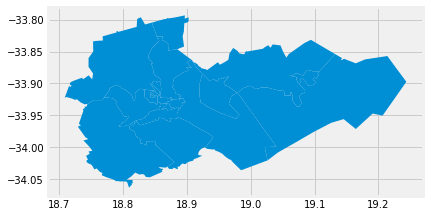

In [226]:
wards_wc[wards_wc.MUNICNAME == "Stellenbosch Local Municipality"].plot()

(133, 10)


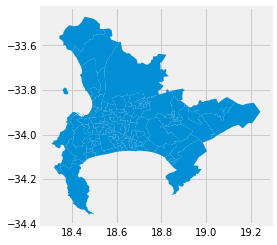

In [227]:
wards = wards_wc[(wards_wc.MUNICNAME == "City of Cape Town Metropolitan Municipality") | (wards_wc.MUNICNAME == "Stellenbosch Local Municipality")]
print(wards.shape)
wards.plot()